# Computer Vision - Assignment 2 - Convolutional Neural Networks for Image Classification

#### 10 (+3) points   |   Due date: November 25 23:59   |   Submission site: https://pradogrado2223.ugr.es/

### Student's Full Name: <mark>Pedro Ramos Suárez</mark>

The goal of this assignment is to learn how to implement and use CNN models using the Fastai library. 



---



*NOTA:* Es recomendable no ejecutar el cuaderno, utilizando las salidas que ya se incluyen de la última ejecución, debido al elevado tiempo de cómputo (2-3 horas en total) y que los comentarios están realizados sobre los resultados obtenidos en esta última ejecución.

Esto se podría haber mejorado utilizando CrossValidation, pero debido a que he priorizado realizar más iteraciones de cada modelo para obtener mejores resultados en cada caso, el tiempo de ejecución sería demasiado alto.

Sin embargo, trás revisar estos comentarios se puede ejecutar para comprobar que la práctica funciona correctamente.

The goal of this assignmnet is to gain experience designing and training convolutional neural networks, using fast.ai. From a base network architecture that is provided, you have to learn to experiment with it and improve it by adding, modifying or deleting layers from this architecture in the task of classifying images into 25 categories. To carry out this assignment, a help guide is provided to know how:
1. Basic functions of reading data, training and optimization can be performed;
2. Graphs for the evolution of the classification error in
the training and validation sets can be created;
3. The classification error in the test set can be computed.

In [ ]:
import sys
import subprocess
import pkg_resources

required = {'nbdev', 'fastbook'}
installed = {pkg.key for pkg in pkg_resources.working_set}
missing = required - installed
print(missing)

if 'nbdev' in missing:
    print("INSTALLING nbdev")
    !pip install nbdev
!pip list |grep nbdev
   
if 'fastbook' in missing:
    print("INSTALLING fastbook")
    !pip install -Uqq fastbook
!pip list |grep fastbook

{'fastbook', 'nbdev'}
INSTALLING nbdev
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 64 kB 758 kB/s 
     |████████████████████████████████| 58 kB 3.8 MB/s 
     |████████████████████████████████| 78 kB 3.6 MB/s 
     |████████████████████████████████| 1.6 MB 52.3 MB/s 
nbdev                         2.3.9
INSTALLING fastbook
     |████████████████████████████████| 719 kB 4.1 MB/s 
     |████████████████████████████████| 451 kB 39.2 MB/s 
     |████████████████████████████████| 1.3 MB 43.2 MB/s 
     |████████████████████████████████| 5.5 MB 54.4 MB/s 
     |████████████████████████████████| 212 kB 34.9 MB/s 
     |████████████████████████████████| 182 kB 59.7 MB/s 
     |████████████████████████████████| 115 kB 49.6 MB/s 
     |████████████████████████████████| 127 kB 11.4 MB/s 
     |████████████████████████████████| 7.6 MB 43.9 MB/s 
fastbook                      0.0.29


In [ ]:
# The first thing we should do is to apply hardware acceleration via GPU. So, we have to go to Editar - Configuracion del Cuaderno - Acelerador por Hardware GPU

# Now we SET UP Fastai
import fastbook
fastbook.setup_book()

import fastai
import fastcore

print(f'fastcore version {fastcore.__version__} installed')
print(f'fastai version {fastai.__version__} installed')

from nbdev.showdoc import *
from fastai.vision.all import *

Mounted at /content/gdrive
fastcore version 1.5.27 installed
fastai version 2.7.10 installed


In [ ]:
# Function to display evaluation metrics
@patch
@delegates(subplots)
def plot_metrics(self: Recorder, nrows=None, ncols=None, figsize=None, **kwargs):
    metrics = np.stack(self.values)
    names = self.metric_names[1:-1]
    n = len(names) - 1
    if nrows is None and ncols is None:
        nrows = int(math.sqrt(n))
        ncols = int(np.ceil(n / nrows))
    elif nrows is None: nrows = int(np.ceil(n / ncols))
    elif ncols is None: ncols = int(np.ceil(n / nrows))
    figsize = figsize or (ncols * 6, nrows * 4)
    fig, axs = subplots(nrows, ncols, figsize=figsize, **kwargs)
    axs = [ax if i < n else ax.set_axis_off() for i, ax in enumerate(axs.flatten())][:n]
    for i, (name, ax) in enumerate(zip(names, [axs[0]] + axs)):
        ax.plot(metrics[:, i], color='#1f77b4' if i == 0 else '#ff7f0e', label='valid' if i > 0 else 'train')
        ax.set_title(name if i > 1 else 'losses')
        ax.legend(loc='best')
    plt.show()

Añadimos una función que nos permitirá representar una matriz de confusión. Aunque ya tenemos una función para esto en fastai, no es muy útil para cuando tenemos un número elevado de etiquetas, como en el ejercicio 3, ya que no tenemos la opción de no mostrar dichas etiquetas.

Esta función se usará en esos casos, permitiendonos ver una matriz sin valores ni etiquetas, la cuál será útil para ver que la mayoría de valores se encuentran en la diagonal y, por lo cuál, el modelo funciona correctamente.

In [ ]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

def plot_confusion_matrix(array, figsize=(12,12), title='Confusion matrix'):
    df_cm = pd.DataFrame(array)
    plt.figure(figsize = figsize)
    plt.title(title)
    ax = sn.heatmap(df_cm, annot=False, xticklabels=False, yticklabels=False, cmap=sn.color_palette("ch:start=.2,rot=-.3", as_cmap=True))
    ax.set(xlabel='Predicted', ylabel='Actual')
    plt.show()



---



---



---



# **Exercise 1:** BaseNet in CIFAR100 (4 points)

*Dataset:*
In this exercise, we will work with part of the CIFAR100 dataset. This dataset consists of 60K color images of 32x32x3 (RGB) depicting 100 different classes (600 images per class). There are 50K images for training and 10K for testing. For the development of the exercise we will only consider 25 classes (out of 100). Therefore, the training set has 12,500 images and the test set 2,500 images. 10% of the training set will be used for validation. 

**Model BaseNet:**
We start by creating a base model called *BaseNet* which, after its training and execution, will give us a classification error which will be used as reference or baseline for further improvements. In order to create it (and later improve it), we will use a sensible combination of the following layers:
- Convolutional layers (Conv2D, either normal or atrous), 
- Pooling layers (Local and Global MaxPooling2D and AveragePooling2D), 
- Dense layers (also called fully connected layers), 
- Non-linear activations, (e.g. ReLu, leaky ReLu, etc.), 
- Flattening (i.e. convert 2D features to 1D features),  
- Batch Normalization, 
- and Regularization (e.g. Dropout or weight decay).

Our BaseNet model consists of two convolutional layers (conv-relu) at different scales (MaxPooling2D), and one head composed of two linear layers (i.e. two dense layers). The precise architecture is defined in the table below:

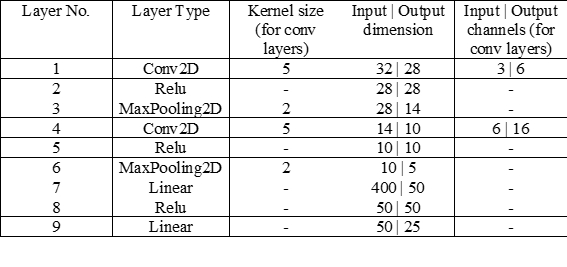

The students must:

1. Become familiar with the *BaseNet* architecture described above, the meaning of the different hyperparameters and the purpose of each layer. Create the code for the *BaseNet* model employing the fastai library, and using any of the techniques shown in the help guide.
2. Train the model and compute the values of “accuracy” and loss function for both training and test sets. Present the results using the provided functions.

In [ ]:
# We get the CIFAR100 dataset
path = untar_data(URLs.CIFAR_100, force_download=True)

In [ ]:
# The CIFAR_100 dataset, as well as the MNIST dataset, follows a common layout for machine learning datasets: 
# separate folders for the training set and the validation set (and/or test set). 
# Let's see what's inside both the training and test sets
print(path)
print(path.ls())
print((path/'train').ls())
print((path/'test').ls())
train_classes = (path/'train').ls()
test_classes = (path/'test').ls()
print(len(train_classes))

/root/.fastai/data/cifar100
[Path('/root/.fastai/data/cifar100/train'), Path('/root/.fastai/data/cifar100/test')]
[Path('/root/.fastai/data/cifar100/train/people'), Path('/root/.fastai/data/cifar100/train/large_carnivores'), Path('/root/.fastai/data/cifar100/train/fish'), Path('/root/.fastai/data/cifar100/train/medium_mammals'), Path('/root/.fastai/data/cifar100/train/large_man-made_outdoor_things'), Path('/root/.fastai/data/cifar100/train/small_mammals'), Path('/root/.fastai/data/cifar100/train/reptiles'), Path('/root/.fastai/data/cifar100/train/large_omnivores_and_herbivores'), Path('/root/.fastai/data/cifar100/train/flowers'), Path('/root/.fastai/data/cifar100/train/vehicles_2'), Path('/root/.fastai/data/cifar100/train/non-insect_invertebrates'), Path('/root/.fastai/data/cifar100/train/aquatic_mammals'), Path('/root/.fastai/data/cifar100/train/trees'), Path('/root/.fastai/data/cifar100/train/vehicles_1'), Path('/root/.fastai/data/cifar100/train/large_natural_outdoor_scenes'), Path('

This dataset is just like the CIFAR-10, except it has 100 classes containing 600 images each. There are 500 training images and 100 testing images per class. **The 100 classes in the CIFAR-100 are grouped into 20 superclasses**. Each image comes with a "fine" label (the class to which it belongs) and a "coarse" label (the superclass to which it belongs).

In [ ]:
files_train = get_image_files(path/'train')
files_test = get_image_files(path/'test')
print('Total training images: ', len(files_train))
print('Total test images: ', len(files_test))

Total training images:  50000
Total test images:  10000


We now keep the first 25 classes. To do so, we remove the last 75 from the dataset.

In [ ]:
#https://stackoverflow.com/questions/185936/how-to-delete-the-contents-of-a-folder
import shutil
number_of_classes_to_keep = 25
number_of_superclasses_to_keep = int(number_of_classes_to_keep/5)
print('SUPERCLASSES DELETED:')
for i in range(number_of_superclasses_to_keep,len(train_classes)):
  print(train_classes[i])
  shutil.rmtree(train_classes[i]) 
print('SUPERCLASSES KEPT:')
for i in range(number_of_superclasses_to_keep):
  print(train_classes[i])

SUPERCLASSES DELETED:
/root/.fastai/data/cifar100/train/small_mammals
/root/.fastai/data/cifar100/train/reptiles
/root/.fastai/data/cifar100/train/large_omnivores_and_herbivores
/root/.fastai/data/cifar100/train/flowers
/root/.fastai/data/cifar100/train/vehicles_2
/root/.fastai/data/cifar100/train/non-insect_invertebrates
/root/.fastai/data/cifar100/train/aquatic_mammals
/root/.fastai/data/cifar100/train/trees
/root/.fastai/data/cifar100/train/vehicles_1
/root/.fastai/data/cifar100/train/large_natural_outdoor_scenes
/root/.fastai/data/cifar100/train/household_furniture
/root/.fastai/data/cifar100/train/fruit_and_vegetables
/root/.fastai/data/cifar100/train/insects
/root/.fastai/data/cifar100/train/food_containers
/root/.fastai/data/cifar100/train/household_electrical_devices
SUPERCLASSES KEPT:
/root/.fastai/data/cifar100/train/people
/root/.fastai/data/cifar100/train/large_carnivores
/root/.fastai/data/cifar100/train/fish
/root/.fastai/data/cifar100/train/medium_mammals
/root/.fastai/d

In [ ]:
# We also remove the same superclasses from the test set
for i in range(number_of_superclasses_to_keep,len(test_classes)):
  print(test_classes[i])
  shutil.rmtree(test_classes[i]) 

/root/.fastai/data/cifar100/test/small_mammals
/root/.fastai/data/cifar100/test/reptiles
/root/.fastai/data/cifar100/test/large_omnivores_and_herbivores
/root/.fastai/data/cifar100/test/flowers
/root/.fastai/data/cifar100/test/vehicles_2
/root/.fastai/data/cifar100/test/non-insect_invertebrates
/root/.fastai/data/cifar100/test/aquatic_mammals
/root/.fastai/data/cifar100/test/trees
/root/.fastai/data/cifar100/test/vehicles_1
/root/.fastai/data/cifar100/test/large_natural_outdoor_scenes
/root/.fastai/data/cifar100/test/household_furniture
/root/.fastai/data/cifar100/test/fruit_and_vegetables
/root/.fastai/data/cifar100/test/insects
/root/.fastai/data/cifar100/test/food_containers
/root/.fastai/data/cifar100/test/household_electrical_devices


Now we verify if we have removed them correctly. 

In [ ]:
print(path)
train_classes = (path/'train').ls()
test_classes = (path/'test').ls()
print(len(train_classes))
print(len(test_classes))

/root/.fastai/data/cifar100
5
5


And that the number of examples is correct

In [ ]:
files_train = get_image_files(path/'train')
files_test = get_image_files(path/'test')
print('Total training images: ', len(files_train))
print('Total test images: ', len(files_test))

Total training images:  12500
Total test images:  2500


Now we should have 12500 images for training and 2500 images for testing. 

Next, we should employ DataLoaders and DataBlock to load the data. 

### *Implementación del ejercicio*

Después de cargar los datos, lo primero que vamos a hacer es comprobar la distribución de datos.

Para ello, podemos comprobar cuantos elementos tenemos de cada clase en el conjunto de entrenamiento:

In [ ]:
# Code to be done by the students.

for i in range(len(train_classes)):
  for j in range(len(train_classes[i].ls())):
    print("Clase: ", train_classes[i].ls()[j], end=" ")
    print("Número de elementos: ", len(train_classes[i].ls()[j].ls()))

Clase:  /root/.fastai/data/cifar100/train/people/girl Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/people/man Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/people/baby Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/people/boy Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/people/woman Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/large_carnivores/leopard Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/large_carnivores/bear Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/large_carnivores/lion Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/large_carnivores/tiger Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/large_carnivores/wolf Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/fish/trout Número de elementos:  500
Clase:  /root/.fastai/data/cifar100/train/fish/ray Número de element

Y en el conjunto de test:

In [ ]:
for i in range(len(test_classes)):
  for j in range(len(test_classes[i].ls())):
    print("Clase: ", test_classes[i].ls()[j], end=" ")
    print("Número de elementos: ", len(test_classes[i].ls()[j].ls()))

Clase:  /root/.fastai/data/cifar100/test/people/girl Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/people/man Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/people/baby Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/people/boy Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/people/woman Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/large_carnivores/leopard Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/large_carnivores/bear Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/large_carnivores/lion Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/large_carnivores/tiger Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/large_carnivores/wolf Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/fish/trout Número de elementos:  100
Clase:  /root/.fastai/data/cifar100/test/fish/ray Número de elementos:  100
Cla

Creamos el DataLoader. Para ello, usamos las imágenes de train, y le cambiamos el tamaño para asegurarnos que son de 32x32x3 (que deberían serlo por defecto) para asegurarnos que funcionan con nuestro modelo. Además, añadimos un splitter que permitirá utilizar un 90% de los datos para entrenamiento y un 10% para test. Obtenemos las etiquetas de cada imagen del nombre de la carpeta que las contiene.

Para confirmar que esto se ha realizado correctamente, visualizaremos algunas imagenes con sus correspondientes etiquetas.

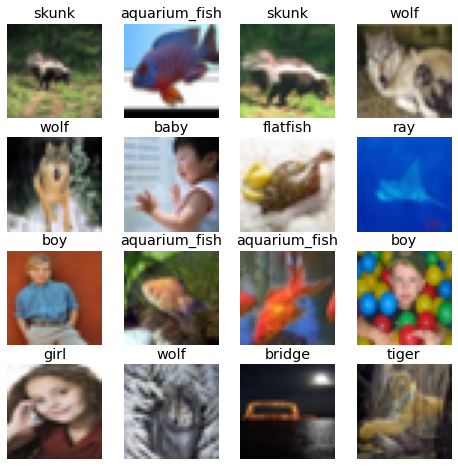

In [ ]:
SEED = 42

dls = DataBlock(
    blocks = (ImageBlock, CategoryBlock), # Input: Image, Output: Category
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.1, seed=SEED), # 10% validation
    get_y = parent_label,
    item_tfms = [Resize(32, method='squish')], # Resize to 32x32x3
).dataloaders(path/'train', bs=32)

dls.show_batch(max_n=16, figsize=(8, 8)) # Shows a batch of images

Creamos el modelo que nos solicitan para el ejercicio. Este modelo consta de convoluciones (Conv2d()), función de activación ReLU (ReLU()), pooling utilizando el elemento máximo (MaxPool2d()), una función para pasar de la matriz a un vector (Flatten()), capa totlamente conectada (Linear()) y Softmax, que para un vector $w = (w_{1}, \dots, w_{n})$, nos devuelve $w' = (w_{1}', \dots, w_{n}')$ tal que:
$$w_{i}' = \frac{e^{w_{i}}}{\sum_{k=1}^{n}e^{w_{k}}}, \quad i \in \{1, \dots, n\}$$
utilizada para normalizar la salida.

In [ ]:
exercise1Net = sequential(
    nn.Conv2d(in_channels=3, out_channels=6, kernel_size=(5,5)), # Output: 28x28x6
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=(2,2)), # Output: 14x14x6
    nn.Conv2d(in_channels=6, out_channels=16, kernel_size=(5,5)), # Output: 10x10x16
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=(2,2)), # Output: 5x5x16
    nn.Flatten(), # Output: 400x1
    nn.Linear(in_features=400, out_features=50), # Output: 50x1
    nn.ReLU(),
    nn.Linear(in_features=50, out_features=25), # Output: 25x1
    nn.Softmax(dim=-1)
)

Para el error usaremos CrossEntropyLossFlat(), función de Fastai que implementa CrossEntropyLoss. Este error está basado en el logritmo, aumentando el error cuanto más lejos está la predicción del valor real. Utiliza valores entre 0 y 1 y, debido a ello, añade una capa de Softmax. Debido a esto, nuestro modelo consta de dos capas de softmax lo cual, como veremos más adelante, empeora los resultados.

Utilizaremos como métricas el accuracy, que es el porcentaje de valores de validación etiquetados correctamente, y error_rate, que es el porcentaje de valores de validación etiquetados incorrectamente (accuracy + error_rate = 1).

Podemos comprobar que el modelo es el que se nos ha pedido con learn.summary(), que nos da un resumen del modelo, tanto de las capas que lo forman como del número de parámetros total y de cada capa.

In [ ]:
learn = Learner(dls, exercise1Net, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary() # show all details

Sequential (Input shape: 32 x 3 x 32 x 32)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 6 x 28 x 28    
Conv2d                                    456        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 6 x 14 x 14    
MaxPool2d                                                      
____________________________________________________________________________
                     32 x 16 x 10 x 10   
Conv2d                                    2416       True      
ReLU                                                           
____________________________________________________________________________
                     32 x 16 x 5 x 5     
MaxPool2d                                                      
____________________________________________________________________________
                     32 x 400    

Para poder entrenarlo, calculamos el learning rate adecuado. Para ello, utilizamos lr_find, que nos devuelve cuatro valores, cuya eficacia para obtener mejores resultados es: Valley > Slide > Steep > Minimum. Debido a ello, utilizaremos lr[0], que almacena el valor de valley.

Learning Rate: 0.009462371468544006


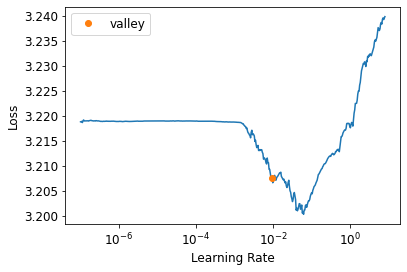

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")

Una vez que tenemos los datos, el modelo y el learning rate, podemos entrenar el modelo. Por ahora, lo entrenaremos durante 10 épocas utilizado el learning rate calculado previamente, y mostraremos los resultados con plot_metrics() tanto en tabla, en la que podemos ver como evolucionan los resultados en cada iteración, como en gráficas. Además, con show_results() podremos ver algunas de las predicciones realizadas en validación.

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,3.168614,3.166204,0.114400,0.885600,00:18
1,3.231518,3.250722,0.034400,0.965600,00:18
2,3.192617,3.174853,0.095200,0.904800,00:19
3,3.162304,3.168967,0.104000,0.896000,00:18
4,3.155792,3.165501,0.119200,0.880800,00:18
5,3.116055,3.113348,0.169600,0.830400,00:18
6,3.093308,3.090880,0.190400,0.809600,00:18
7,3.087491,3.091955,0.188000,0.812000,00:21
8,3.067115,3.088439,0.192800,0.807200,00:20
9,3.058899,3.088020,0.192000,0.808000,00:19


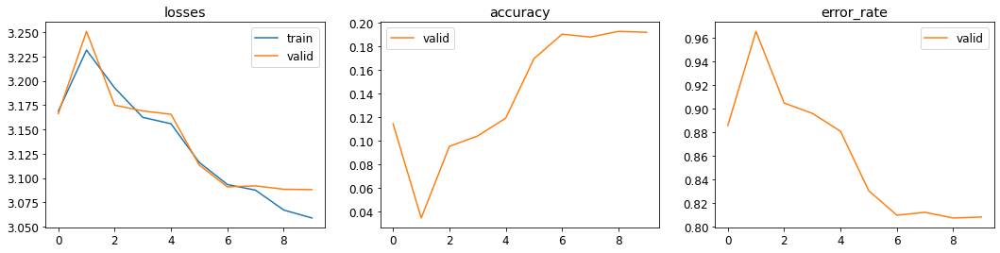

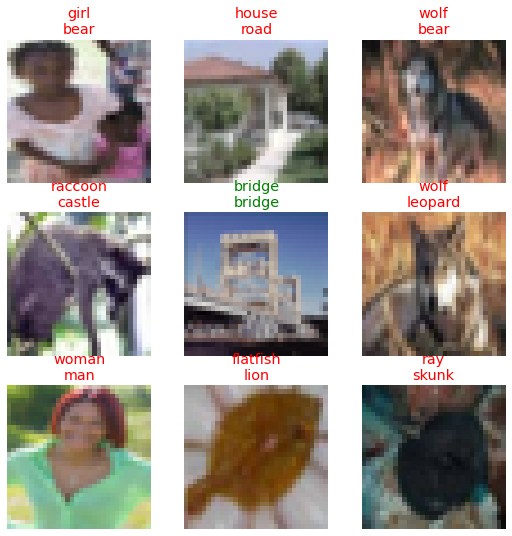

In [ ]:
learn.fit_one_cycle(n_epoch=10, lr_max=lr[0]) # running the optimizer one-cycle
learn.recorder.plot_metrics() # shows accuracy curve along epochs
learn.show_results()

A partir de estos resultados, podemos imaginar que este modelo no es muy bueno, ya que sólo tenemos un 20 % de accuracy en validación, y la mayoría de imagenes están clasificadas incorrectamente.

Finalmente, queremos comprobar la eficacia del modelo entrenado con los tados de test. Para ello, comenzamos creando un conjunto con las imágenes de test y sus etiquetas correspondientes:

In [ ]:
# We create the test dataloader
test_dl = learn.dls.test_dl(files_test, with_labels=True)

Comprobamos que tenemos todos los ejemplos, y que hay ejemplos de todas las clases:

In [ ]:
# We can check that we have indeed 2500 test examples
print("Size: ", test_dl.n)
print("Number of categories: ", test_dl.c)
print("Categories: ", test_dl.vocab)

Size:  2500
Number of categories:  25
Categories:  ['aquarium_fish', 'baby', 'bear', 'boy', 'bridge', 'castle', 'flatfish', 'fox', 'girl', 'house', 'leopard', 'lion', 'man', 'porcupine', 'possum', 'raccoon', 'ray', 'road', 'shark', 'skunk', 'skyscraper', 'tiger', 'trout', 'wolf', 'woman']


Y realozamos la predicción:

In [ ]:
# We perform prediction on this bunch of data
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)

Para ver la eficacia del modelo, calculamos el accuracy o porcentaje de aciertos, y podemos visualizar los resultados con una matriz de confusión. También veremos algunos de los casos en los que más se equivoca el modelo.

Number of test examples: 2500


The test accuracy is:  19.2 %


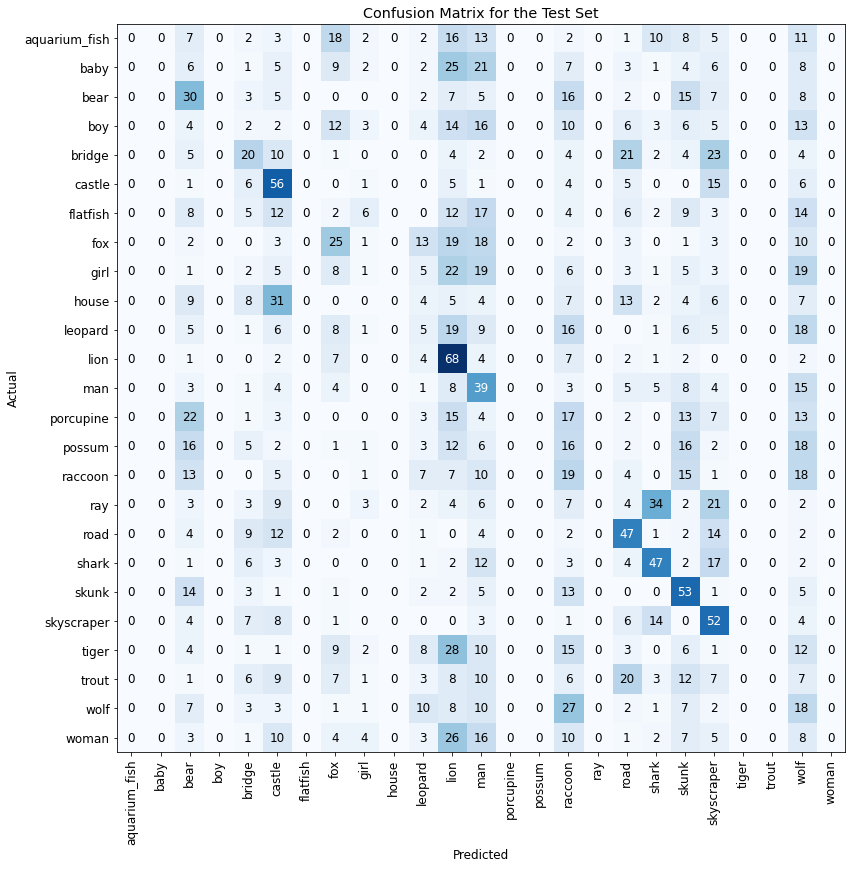

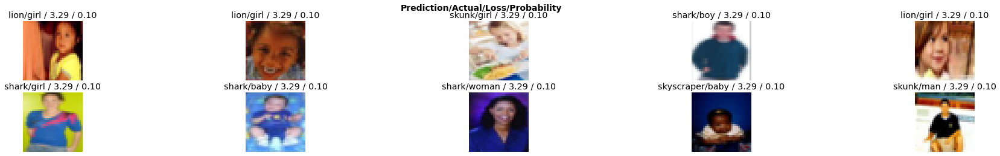

In [ ]:
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
interp.plot_confusion_matrix(figsize=(12, 12), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

interp.most_confused(min_val=10)
interp.plot_top_losses(10, nrows=2, figsize=(32,4))

Tal y como hemos comentado, no obtenemos muy buenos resultados. En la matriz de confusión deberíamos esperar poder encontrar la mayoría de valores en la diagonal, indicando que se han clasificado correctamente, sin embargo eso no ocurre.

De hecho, es curioso ver que, en esta ejecución, hay etiquetas para las que no les asocia ninguna imagen.

Un error que tenía el modelo anterior (y que hemos mantenido por que es lo que nos pedia el ejercicio) es añadir una capa de Softmax al final. Esto se debe a que, como hemos comentado previamente, dicha capa ya está implementada por defecto en CrossEntropyLossFlat. Debido a ello, vovemos a crear el modelo pero sin la capa de Softmax, para ver si obtenemos una mejora de resultados:

In [ ]:
exercise1Net = sequential(
    nn.Conv2d(in_channels=3, out_channels=6, kernel_size=(5,5)), # Output: 28x28x6
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=(2,2)), # Output: 14x14x6
    nn.Conv2d(in_channels=6, out_channels=16, kernel_size=(5,5)), # Output: 10x10x16
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=(2,2)), # Output: 5x5x16
    nn.Flatten(), # Output: 400x1
    nn.Linear(in_features=400, out_features=50), # Output: 50x1
    nn.ReLU(),
    nn.Linear(in_features=50, out_features=25) # Output: 25x1
    #nn.Softmax(dim=-1)
)

learn = Learner(dls, exercise1Net, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary() # show all details

Sequential (Input shape: 32 x 3 x 32 x 32)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 6 x 28 x 28    
Conv2d                                    456        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 6 x 14 x 14    
MaxPool2d                                                      
____________________________________________________________________________
                     32 x 16 x 10 x 10   
Conv2d                                    2416       True      
ReLU                                                           
____________________________________________________________________________
                     32 x 16 x 5 x 5     
MaxPool2d                                                      
____________________________________________________________________________
                     32 x 400    

Volvemos a calcular el Learning Rate para este nuevo modelo.

Learning Rate:  SuggestedLRs(valley=0.005649369675666094)


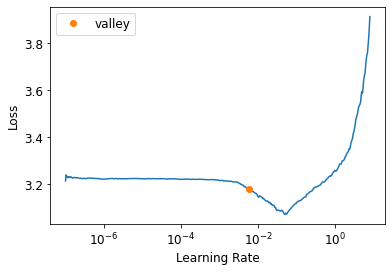

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print("Learning Rate: ", lr)

Y volvemos a entrenar el modelo con los datos de train:

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.761893,2.776896,0.161600,0.838400,00:19
1,2.456558,2.499414,0.248800,0.751200,00:19
2,2.320979,2.283117,0.299200,0.700800,00:19
3,2.216022,2.294903,0.316800,0.683200,00:21
4,2.095347,2.194433,0.326400,0.673600,00:18
5,1.962226,2.094647,0.365600,0.634400,00:19
6,1.792144,2.053329,0.384800,0.615200,00:18
7,1.741963,2.014827,0.394400,0.605600,00:18
8,1.610087,2.013458,0.403200,0.596800,00:19
9,1.569320,2.010289,0.412000,0.588000,00:19


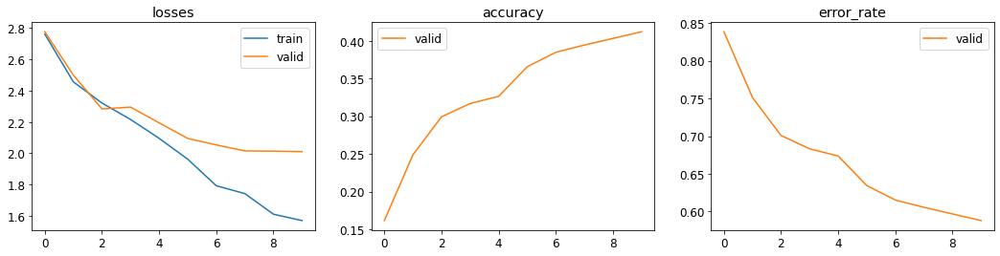

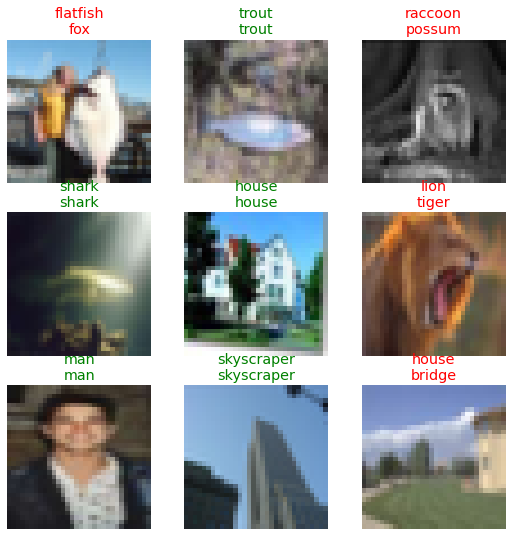

In [ ]:
learn.fit_one_cycle(n_epoch=10, lr_max=lr[0]) # running the optimizer one-cycle
learn.recorder.plot_metrics() # shows accuracy curve along epochs
learn.show_results()

Ya con el accuracy en validación podemos observar una mejora considerable, pasando de cerca del 20 % a cerca del 40 %. También podemos observar una buena mejora que las predicciones de validación.

Finalmente, volvemos a predecir los datos de test:

In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)

Y calculamos el accuracy y la función de confusión:

Number of test examples: 2500


The test accuracy is:  39.56 %


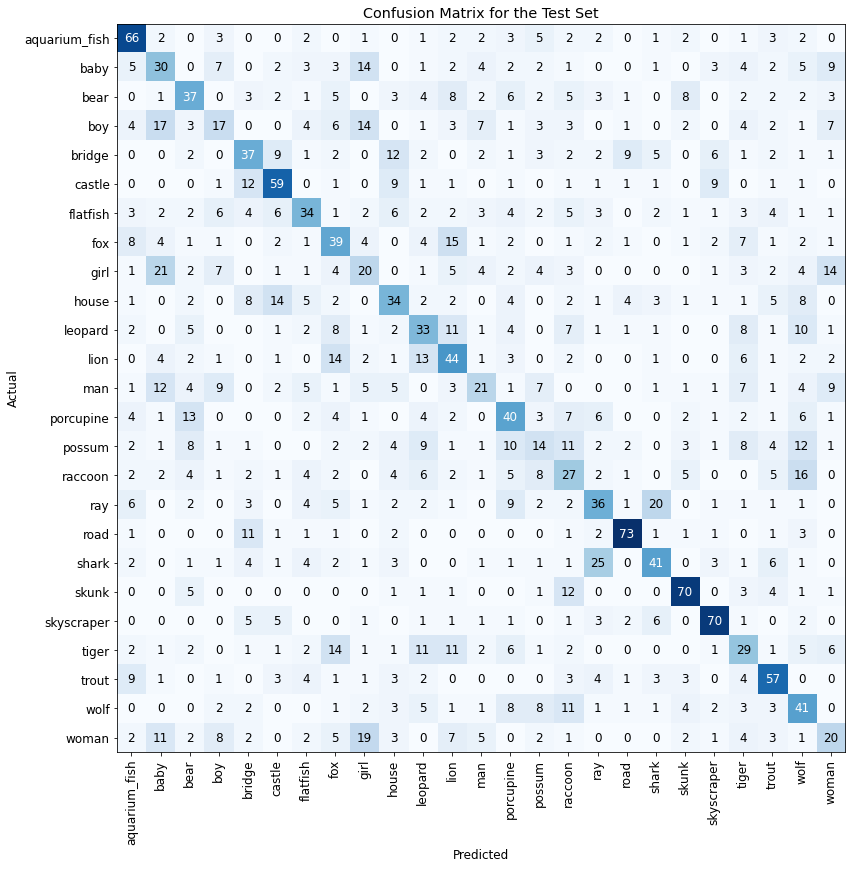

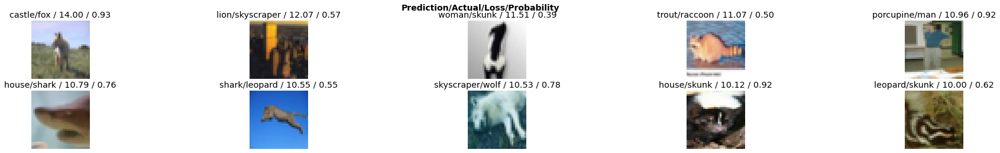

In [ ]:
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
interp.plot_confusion_matrix(figsize=(12, 12), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

interp.most_confused(min_val=10)
interp.plot_top_losses(10, nrows=2, figsize=(32,4))

En este caso, podemos ver que si están la mayoría de valores en la diagonal, lo cual nos permite saber que este modelo funciona mucho mejor que el anterior.

Podemos añadir una función que nos permita ver que porcentaje le asigna a cada etiqueta para una cierta imagen que le pasemos por parámetro, mostrándonos un histograma con la probabilidad de cada etiqueta:

In [ ]:
import re

def graph_prob(im, n):
  categories = learn.dls.vocab

  # Get label name from file name
  s = str(im)
  label = re.findall('(.*?)\/', s)
  label = label[len(label)-1]

  # Dicctionary with the predictions
  pred, idx, probs = learn.predict(im)
  prob_dict = dict(zip(categories, map (float, probs)))
  prob_dict = dict(sorted(prob_dict.items(), key=lambda item: item[1])) # Sort dictionary
  pred = max(prob_dict, key=prob_dict.get)

  dictionary = dict(list(prob_dict.items())[-n:])

  # Colors of the bars (green = real label, blue = others labels)
  color = ['b']*n
  if (list(dictionary.keys()).count(label) > 0):
    pos = list(dictionary.keys()).index(label)
    color[pos] = 'g'

  # Plot
  fig, axs = plt.subplots(1, 2, figsize=(15, 5))

  # Image
  axs[0].imshow(plt.imread(im))
  axs[0].axis('off')
  axs[0].title.set_text(label)

  # Bar diagram
  axs[1].bar(list(dictionary.keys()), list(dictionary.values()), label="Prediction: "+pred, color=color)
  axs[1].legend()

  plt.xticks(rotation = 90)

  plt.show()

Si tomamos 5 imágenes aleatorias obtenemos:

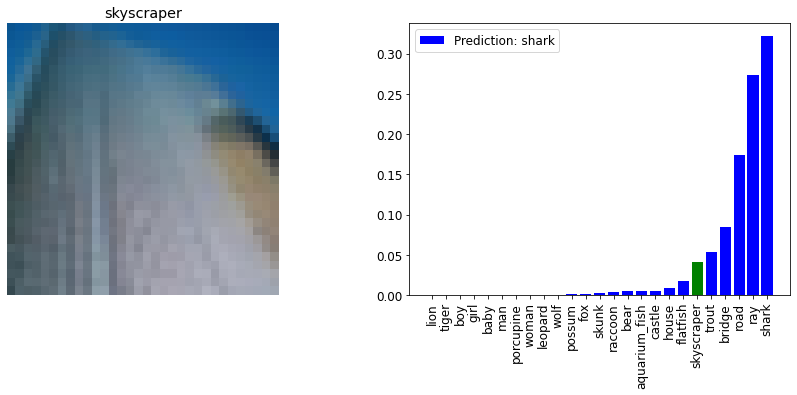

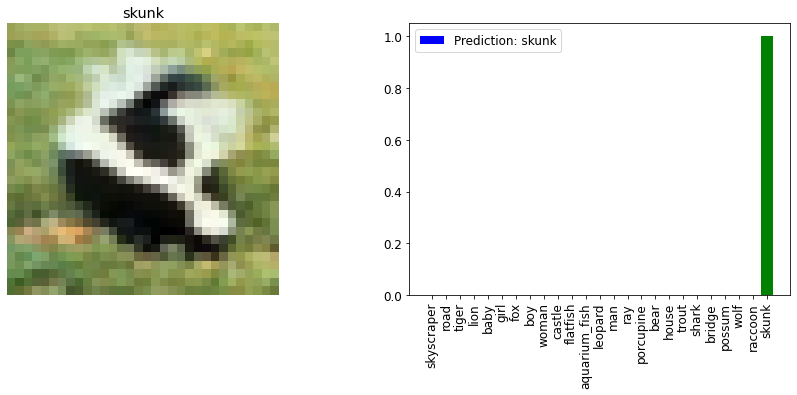

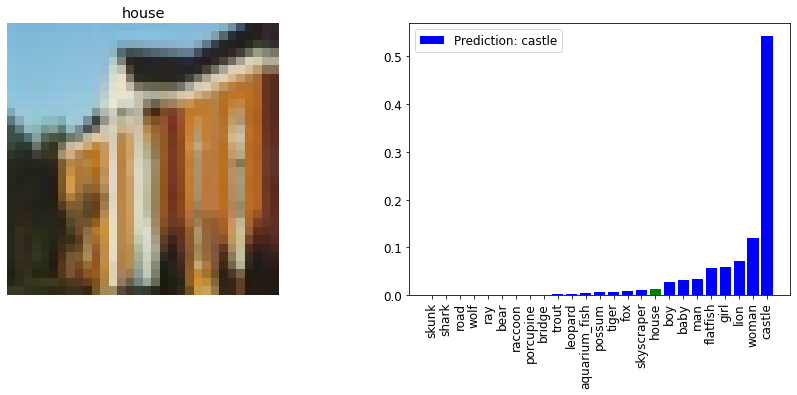

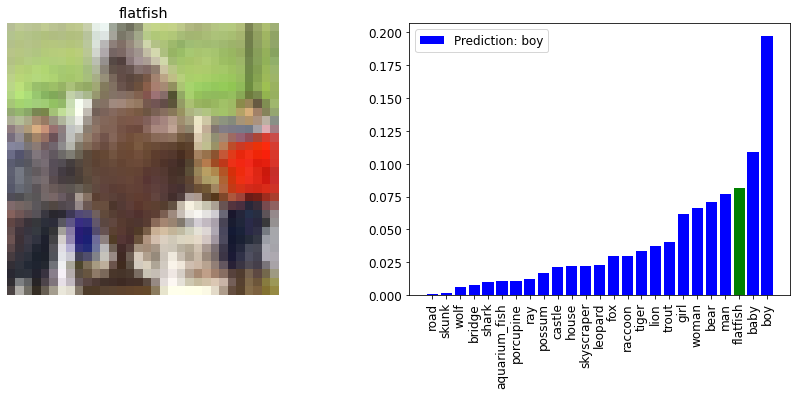

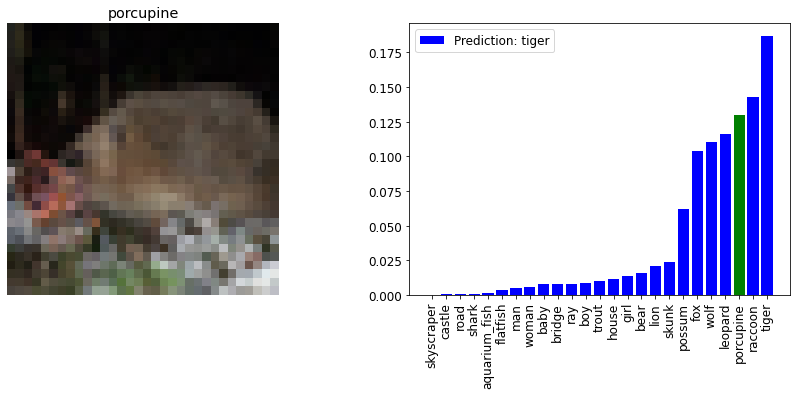

In [ ]:
import random

for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)



---



---



---



# **Exercise 2:** **Improvement of the BaseNet model (3 points)**
Now the goal is to create, by making judicious architectural and implementation choices, an enhanced deep network based on *BaseNet*. A good combination of layers can make the accuracy of the new model close to 50% on our CIFAR100 data. To enhance your network, you may consider adding any combination of the following enhancement options:
1. **Data normalization**. Scale normalization of the input data, in general, makes training easier and more robust. Use the DataLoader or ImageDataLoaders class with the correct parameters so that the data is well conditioned (mean=0, stddev=1) to improve training. You must ensure that test_transform uses the same normalization parameters as train_transform.
2. **Batch normalization**. Batch-normalization layers in most cases help to reduce overfitting and improve model training. Add normalization layers after convolutional layers and before the ReLU layer, but try including it after ReLU layers as well.
3. **Depth increase**. Experiment adding convolutional layers. Do not always put a maxpool layer after each conv layer, as this leads to excessive loss of information by reducing the number of units. If needed use UpSampling (Transposed Convolution) layers to increase the number of units.
4. **Dropout**. This layer introduces regularization by randomly selecting a percentage of active neurons for each mini-batch. This helps the network to specialize neurons in specific and independent information.
5. **Early Stopping**. After how many epochs we should stop training? This answer on stack-exchange (https://datascience.stackexchange.com/questions/18339/why-use-both-validation-set-and-test-set/18346#18346) is a good summary of using train-val-test splits to reduce overfitting. This blog (https://elitedatascience.com/overfitting-in-machine-learning#how-to-prevent) is also a good reference for “early stopping”. Very important: keep in mind that you should never use the test set for anything other than the final evaluation. You should decide for how many epochs you will train your model by looking at the training loss and validation accuracy plots (to do so, evaluate the local minima/maxima of the loss function as well as the classification accuracy). Remember that if you choose too many epochs it would quite likely lead to overfitting, while if you select too few your model quite likely won't  learn enough. In your report, you must include a table similar to the one shown in Exercise 1 to illustrate the architecture of your final improved network. In addition, you must explain the steps taken with the partial results obtained that have finally led you to introduce the proposed modifications.
6. **Data augmentation**.  Use the DataLoader or ImageDataLoaders class data zoom parameters, like zoom_range and/or horizontal_flip. Remember that you should not have any data augmentation in the validation or test sets. If you need a better understanding, try reading Fastai's tutorial on transformations. Look at data augmentation using image transformations.

Vamos a realizar todas las sugerencias del enunciado ya que todas suponen una mejora en los resultados. Comenzamos realizando mejoras al cargar los datos.

Para ello, implementos la normalización de datos (recomendado en 1) con Normalize.from_stats(*imagenet_stats), que utiliza  los coeficientes de ImageNet se consideran estándar en tareas de clasificación de imágenes.

Además, aumentamos los datos (recomendado en 6) utilizando RandomResizedCrop(32) y FlipItem(0.5), que creará nuevas imágenes a partir de las existentes añadiendo zoom y volteando horizontalmente respectivamente.

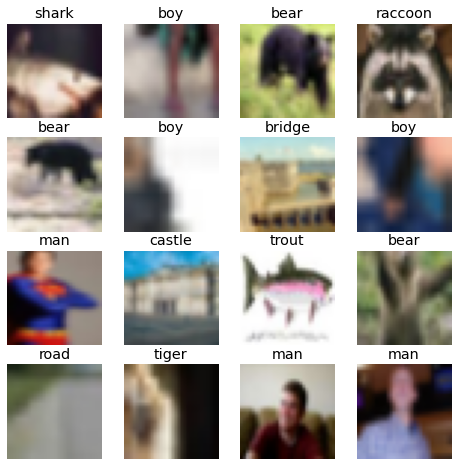

In [ ]:
SEED = 42

dls = DataBlock(
    blocks = (ImageBlock, CategoryBlock), # Input: Image, Output: Category
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.1, seed=SEED),
    get_y = parent_label,
    item_tfms = [Resize(32, method='squish'), RandomResizedCrop(32), FlipItem(0.5)], # Crop and flip images
    batch_tfms = [Normalize.from_stats(*imagenet_stats)]
).dataloaders(path/'train', bs=32)

dls.show_batch(max_n=16, figsize=(8, 8)) # shows a batch of images

A la hora de definir el modelo, podemos implimentar mejoras como la normalización de batches (recomendado en 2), utilizando BatchNorm2d(); e implementamos dropout (recomendado en 4), que elimina aleatoriamente conexiones entre neuronas en las capas totalmente conectadas de forma aleatoria en entrenamiento, implementado con Dropout().

BatchNorm2d() aplica la siguiente normalización:
$$y = \frac{x - E[x]}{\sqrt{Var[x] + \varepsilon}} * \gamma + \beta$$
donde $\gamma$ y $\beta$ son parámetros a entrenar, y la media y la varianza se calculan para cada batch.

Además, aumentamos la profundida (recomendado en 3) añadiendo nuevas capas de convolución, pooling y activación ReLU. Para ello, me he inspirado en los modelos de resnet, que suelen utilizar una covolución seguida de una normalización y activación ReLU. Además, aumentamos las dimensiones, lo cual aumentará en gran medida el número de parámetros.

In [ ]:
exercise2Net = sequential(
    nn.Conv2d(in_channels=3, out_channels=128, kernel_size=(5,5)), # Output: 28x28x128
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.MaxPool2d(kernel_size=(2,2)), # Output: 14x14x128
    nn.Conv2d(in_channels=128, out_channels=128, padding=1, kernel_size=(3,3)), # Output: 14x14x128
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(in_channels=128, out_channels=128, padding=1, kernel_size=(3,3)), # Output: 14x14x128
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.Conv2d(in_channels=128, out_channels=256, kernel_size=(3,3)), # Output: 12x12x256
    nn.BatchNorm2d(256),
    nn.ReLU(),

    nn.MaxPool2d(kernel_size=(2,2)), # Output: 6x6x256
    nn.Conv2d(in_channels=256, out_channels=256, padding=1, kernel_size=(3,3)), # Output: 6x6x256
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(in_channels=256, out_channels=256, padding=1, kernel_size=(3,3)), # Output: 6x6x256
    nn.BatchNorm2d(256),
    nn.ReLU(),

    nn.Conv2d(in_channels=256, out_channels=512, kernel_size=(3,3)), # Output: 4x4x512
    nn.BatchNorm2d(512),
    nn.ReLU(),

    nn.AvgPool2d((4,4)), # Ouput: 1x1x512
    nn.Flatten(), # Output: 512x1
    nn.BatchNorm1d(512),
    nn.Dropout(),

    nn.Linear(in_features=512, out_features=256), # Output: 256x1
    nn.ReLU(),
    nn.BatchNorm1d(256),
    nn.Dropout(),

    nn.Linear(in_features=256, out_features=25) # Output: 25x1
    # nn.Softmax(dim=-1)
)

learn = Learner(dls, exercise2Net, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary() # show all details

Sequential (Input shape: 32 x 3 x 32 x 32)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 128 x 28 x 28  
Conv2d                                    9728       True      
BatchNorm2d                               256        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 128 x 14 x 14  
MaxPool2d                                                      
Conv2d                                    147584     True      
BatchNorm2d                               256        True      
ReLU                                                           
Conv2d                                    147584     True      
BatchNorm2d                               256        True      
ReLU                                                           
____________________________________________________________________________
               

Como hemos visto en el ejercicio anterior, en este caso no implementamos la capa de Softmax ya que está implementada en el error.

Calculamos el Learning Rate para este modelo:

Learning Rate: 0.0002654605486895889


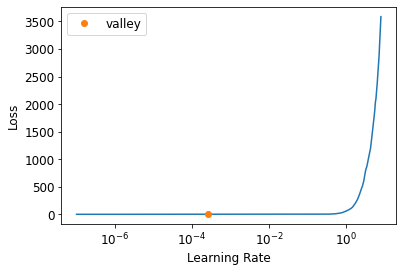

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")

Finalmente, añadimos la última mejora (recomendada en 5) con early stopping, que detendrá el modelo cuando realice varias iteraciones sin encontrar mejora.

Esto nos permite aumentar el número de iteraciones para que, en vez de detenerse tras un cierto número de iteraciones, se detenga al no encontrar mejora. Nótese que, como sólo realizamos 25 épocas de máximo, es muy probable que no se llegue a detener por early stopping, que al usar 5 de paciencia, requiere que ocurran 5 sin mejora, y normalmente se detendrá al alcanzar el máximo de iteraciones.

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,3.044038,2.661630,0.229600,0.770400,00:27
1,2.786901,2.480555,0.255200,0.744800,00:27
2,2.677411,2.417891,0.288800,0.711200,00:27
3,2.620341,2.274932,0.311200,0.688800,00:29
4,2.524737,2.213921,0.313600,0.686400,00:27
5,2.420054,2.102155,0.341600,0.658400,00:28
6,2.328104,2.070419,0.370400,0.629600,00:27
7,2.241849,1.894995,0.403200,0.596800,00:27
8,2.155922,1.844599,0.398400,0.601600,00:27
9,2.131161,1.713274,0.456000,0.544000,00:29


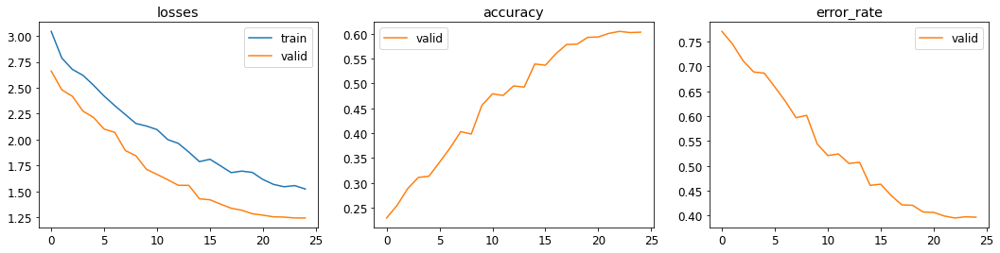

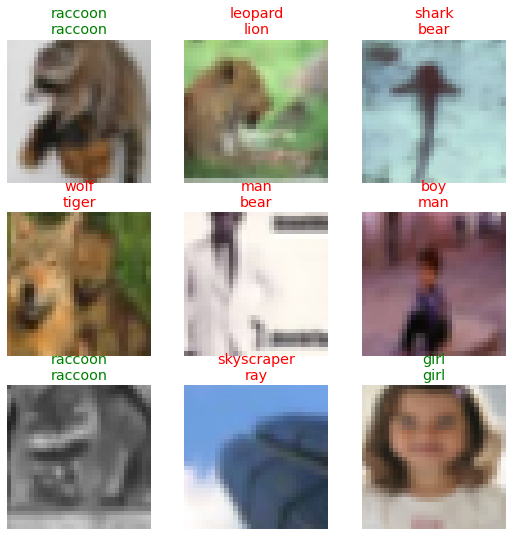

In [ ]:
learn.fit_one_cycle(n_epoch=25, lr_max=lr, cbs=EarlyStoppingCallback(monitor='accuracy', min_delta=0.01, patience=5)) # running the optimizer one-cycle
learn.recorder.plot_metrics() # shows accuracy curve along epochs
learn.show_results()

En las gráficas podemos ver que obtenemos mejores resultados en validación que en train. Aunque esto pueda resultar raro, se debe a la inclusión del Dropout, que al cortar conexiones entre las neuronas en entrenamiento nos produce peores resultados, pero como mantenemos todas las conexiones en validación los resultados son mejores.

Finalmente, predecimos los datos de entrenamiento y calculamos el accuracy y la matriz de confusión para ver si hemos obtenido una mejora:

Number of test examples: 2500


The test accuracy is:  61.56 %


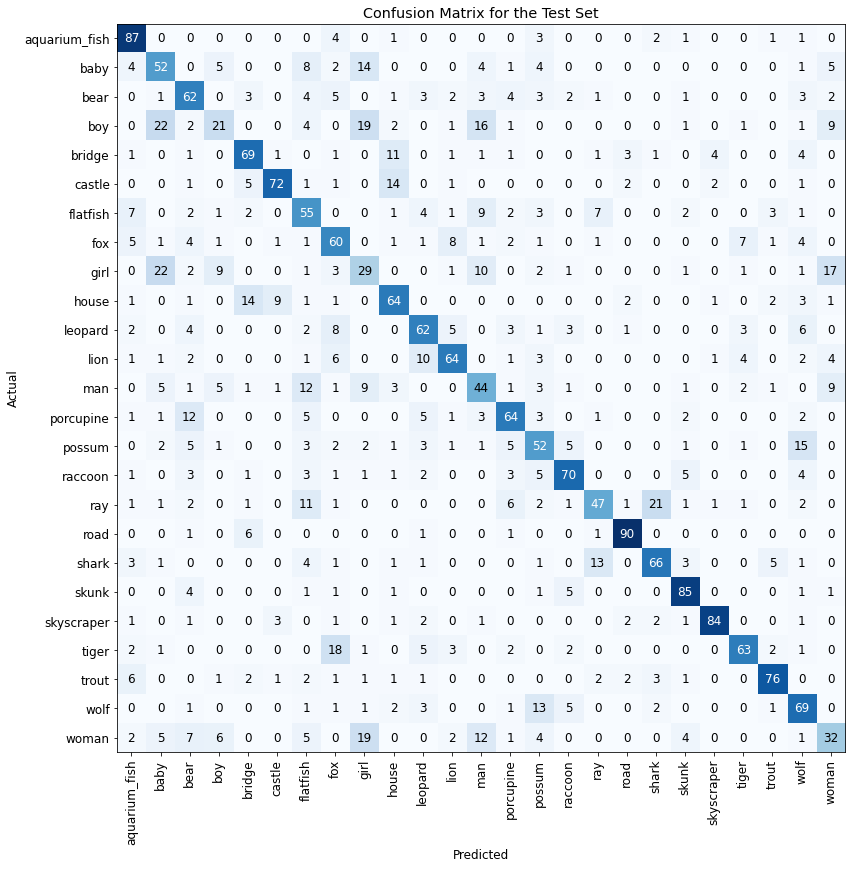

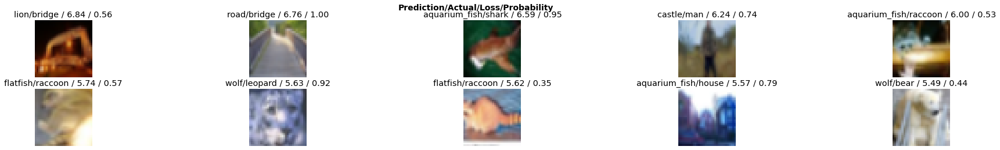

In [ ]:
test_dl = learn.dls.test_dl(files_test, with_labels=True)
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
interp.plot_confusion_matrix(figsize=(12, 12),title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

interp.most_confused(min_val=10)
interp.plot_top_losses(10, nrows=2, figsize=(32,4))

Los resultados obtenidos los estudiaremos en más detalle en el ejercicio bonus, ya que tiene más sentido comparar los tres modelos usados en CIFAR100 simultáneamente.

Además, puede verse en la matriz de confusión que la mayoría de errores tienen sentido ya que, por ejemplo, confunde women con girl, boy con girl, tiger con fox... que son cosas parecidas y, por lo cual, es normal que se equivoque en dichos casos.

Finalmente, vamos a visualizar varias predicciones:

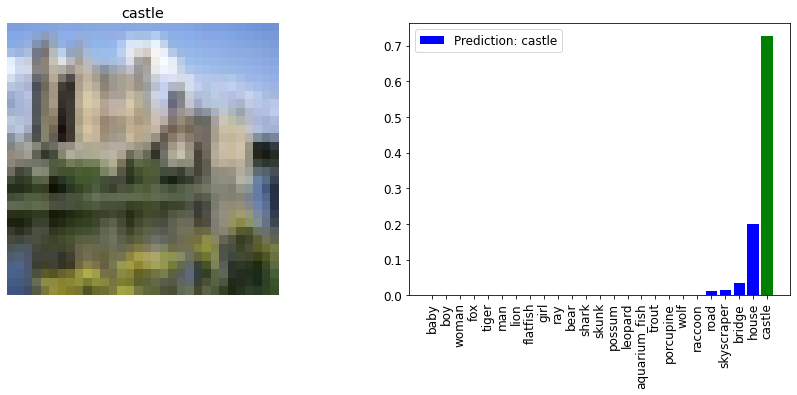

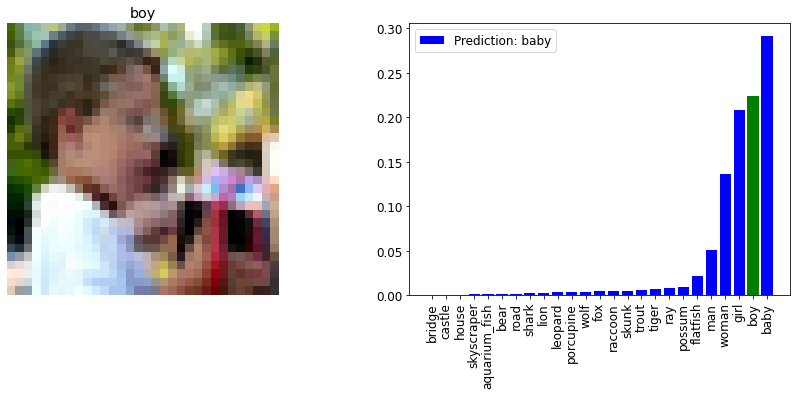

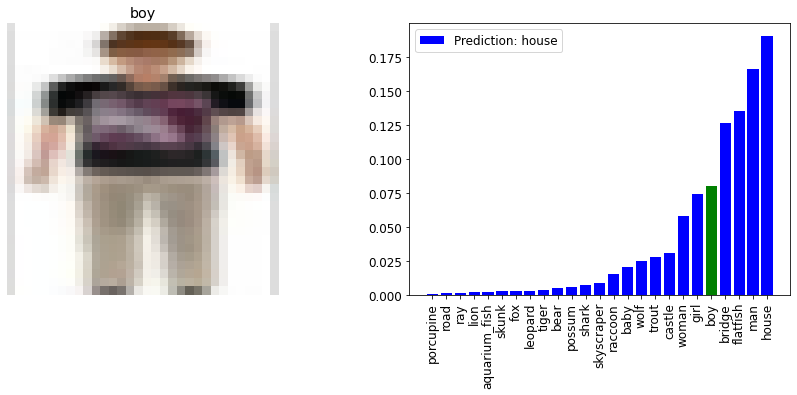

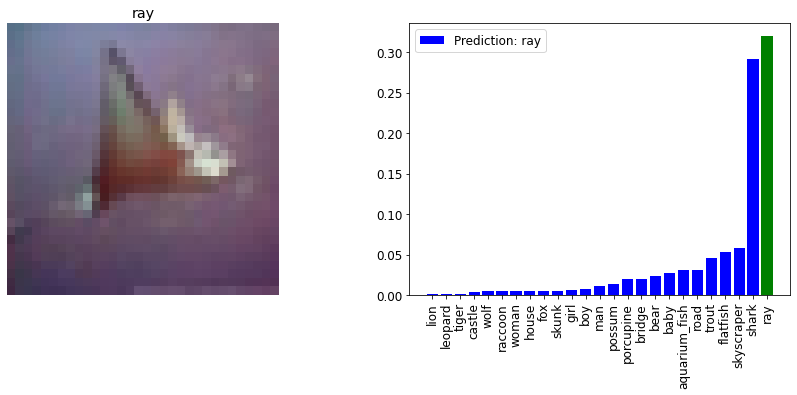

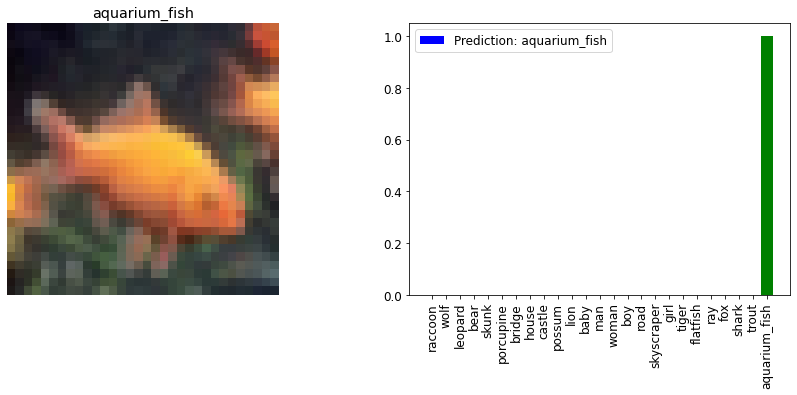

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

Para el ejercicio bonus, como volveremos a usar estos datos, creamos una copia.

In [ ]:
path_cifar = path

---



---



---

# **Exercise  3: Model transfer and fine-tuning with ResNet18 for the Caltech-UCSD Birds-200-2011 database (3 points)**
In this exercise we will work with the Caltech-UCSD Birds-200-2011 dataset (https://www.vision.caltech.edu/datasets/cub_200_2011/). This dataset consists of 11,788 images of 200 bird species. It has 200 classes, with 5,994 for training and 5,794 for testing. Again, 10% of the training set will be left for validation. Read the dataset using the provided functions.

We will use the ResNet18 network model already pre-trained with ImageNet, it can be downloaded from the Fastai Model repository. You have to:
1. **Use ResNet18 as a feature extractor** for the Caltech-UCSD Birds-200-2011 dataset. To do this we will remove at least the head of the downloaded model, we will add some additional convolutional blocks and a new head. Specifically, students have to perform the following experiments:
    
    **1.1.** Download and adapt the ResNet18 model trained with ImageNet to the Caltech-UCSD dataset, retrain this new fully connected layer, and estimate the network performance. 
    
    **1.2.** Remove the head of the model and add new convolutional blocks and a new head designed by you. Retrain your model with Caltech-UCSD. 
    
    **1.3.** Compare the results obtained in 1.2 and 1.1.

  Remember that, during training, you have to freeze the weights in the feature extraction blocks.

2. **Make a fine-tuning of the entire ResNet18 network** for  Caltech-UCSD. Remember that the number of epochs for fine-tuning must be small.





Cargamos los nuevos datos:

In [ ]:
# https://docs.fast.ai/data.external.html
path = untar_data(URLs.CUB_200_2011)

In [ ]:
# We explore a little bit the folders and number of examples.
# train_test_split.txt contains the information about which images are for training and which ones are for testing
print(path)
print(path.ls())
print((path/'CUB_200_2011/').ls())
train_test_split = np.loadtxt('/root/.fastai/data/CUB_200_2011/CUB_200_2011/train_test_split.txt',dtype=int)

print('Number of testing examples: ', (train_test_split[:,1]== 0).sum())
print('Number of training examples: ', (train_test_split[:,1]== 1).sum())
print(train_test_split)

/root/.fastai/data/CUB_200_2011
[Path('/root/.fastai/data/CUB_200_2011/attributes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011')]
[Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/README'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/train_test_split.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/classes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/bounding_boxes.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/attributes'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/image_class_labels.txt'), Path('/root/.fastai/data/CUB_200_2011/CUB_200_2011/parts')]
Number of testing examples:  5794
Number of training examples:  5994
[[    1     0]
 [    2     1]
 [    3     0]
 ...
 [11786     0]
 [11787     1]
 [11788     0]]


In [ ]:
# images.txt contains the numbered list of all images. Combining the information in images.txt and train_test_split.txt we can 
# get the actual images for training and test. First, we read the images.txt file. 
with open('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images.txt') as file:
    images_list = file.readlines()
    images_list = [line.rstrip() for line in images_list]
print(images_list)

['1 001.Black_footed_Albatross/Black_Footed_Albatross_0046_18.jpg', '2 001.Black_footed_Albatross/Black_Footed_Albatross_0009_34.jpg', '3 001.Black_footed_Albatross/Black_Footed_Albatross_0002_55.jpg', '4 001.Black_footed_Albatross/Black_Footed_Albatross_0074_59.jpg', '5 001.Black_footed_Albatross/Black_Footed_Albatross_0014_89.jpg', '6 001.Black_footed_Albatross/Black_Footed_Albatross_0085_92.jpg', '7 001.Black_footed_Albatross/Black_Footed_Albatross_0031_100.jpg', '8 001.Black_footed_Albatross/Black_Footed_Albatross_0051_796103.jpg', '9 001.Black_footed_Albatross/Black_Footed_Albatross_0010_796097.jpg', '10 001.Black_footed_Albatross/Black_Footed_Albatross_0025_796057.jpg', '11 001.Black_footed_Albatross/Black_Footed_Albatross_0023_796059.jpg', '12 001.Black_footed_Albatross/Black_Footed_Albatross_0086_796062.jpg', '13 001.Black_footed_Albatross/Black_Footed_Albatross_0049_796063.jpg', '14 001.Black_footed_Albatross/Black_Footed_Albatross_0006_796065.jpg', '15 001.Black_footed_Albatr

In [ ]:
# We check if all classes are more or less equally well represented. 
classes = (path/'CUB_200_2011/images/').ls()
print('Number of examples per class')
for i in range(len(classes)):
  print(len(classes[i].ls()), end=" ")

Number of examples per class
60 60 51 49 58 60 60 60 60 60 59 60 60 53 60 59 60 60 60 60 59 60 60 53 60 60 58 60 60 58 60 60 58 60 60 60 60 60 57 60 59 59 59 60 59 59 60 60 60 60 60 59 45 60 60 60 50 60 60 60 60 60 60 60 60 59 56 60 60 60 59 60 59 59 60 59 60 60 60 60 60 60 60 56 60 60 60 60 60 60 60 60 60 60 60 60 59 60 60 60 60 44 59 57 60 60 60 60 60 48 59 59 60 60 60 60 60 60 60 60 60 52 41 60 59 60 60 60 60 60 60 60 53 60 59 50 60 60 60 60 59 60 60 60 60 50 60 59 60 60 60 59 60 60 60 60 60 60 60 60 56 58 60 60 59 60 60 60 60 60 60 60 60 60 60 60 58 50 60 60 60 60 60 60 60 59 60 59 60 59 60 59 59 59 60 59 60 60 60 60 

In [ ]:
print(path)
import shutil, os
# If we already have these folders, we remove them because we want to create them from scratch
if os.path.isdir('/root/.fastai/data/CUB_200_2011/train'):
  shutil.rmtree('/root/.fastai/data/CUB_200_2011/train')
if os.path.isdir('/root/.fastai/data/CUB_200_2011/test'):
  shutil.rmtree('/root/.fastai/data/CUB_200_2011/test')

# We copy all images in two folders (train and test). Initially, both folders contain the same information.
shutil.copytree('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images','/root/.fastai/data/CUB_200_2011/train')
shutil.copytree('/root/.fastai/data/CUB_200_2011/CUB_200_2011/images','/root/.fastai/data/CUB_200_2011/test')

/root/.fastai/data/CUB_200_2011


'/root/.fastai/data/CUB_200_2011/test'

In [ ]:
# Now we remove from training those images belonging to test, and we remove
# from test those images belonging to train. 
import os 
for i in range(len(train_test_split)):
    if train_test_split[i,1]==0: #test image
       os.remove(path/'train'/images_list[i].rsplit(' ')[1]) #we remove it from train
    if train_test_split[i,1]==1: #train image
      os.remove(path/'test'/images_list[i].rsplit(' ')[1]) #we remove it from test

In [ ]:
# We list the number of images in the folders to check if we actually have 5,994 images for training and 5,794 for testing
files_train = get_image_files(path/'train')
files_test = get_image_files(path/'test')
print('Total training images: ', len(files_train))
print('Total test images: ', len(files_test))

Total training images:  5994
Total test images:  5794


### *3.1.1*  

Como veremos en el ejercicio Bonus, podemos añadir una serie de mejoras en los datos que no modifican el modelo y podríamos incluir en este ejercicio. Sin embargo, debido a que ese es el objetivo del bonus, las dejamos para dicho ejercicio, y sólo incluimos las vistas en el ejercicio anterior.

En este primer apartado queremos utilizar ResNet18 añadiendo únicamente una capa totalmente conectada. Comenzamos creando el DataLoader con los datos de entrenamiento. Este DataLoader es similar a los usados previamente, pero con los nuevos datos, por lo que no entramos en detalles.

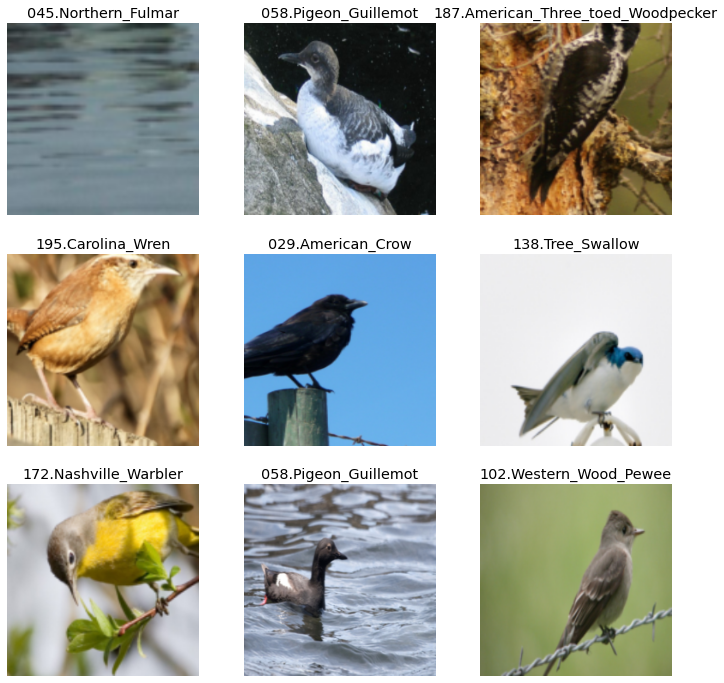

In [ ]:
SEED = 42

dls = DataBlock(
    blocks = (ImageBlock, CategoryBlock), # Input: Image, Output: Category
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.1, seed=SEED),
    get_y = parent_label,
    item_tfms = [Resize(224, method='squish'), RandomResizedCrop(224), FlipItem(0.5)], # Crop and flip images
    batch_tfms = [Normalize.from_stats(*imagenet_stats)]
).dataloaders(path/'train', bs=32)

dls.show_batch(max_n=9, figsize=(12, 12)) # Shows a batch of images

Utilizamos vision_learner en lugar de Learner para cargar el modelo con las capas congeladas y añadiendo una capa final totalmente conectada:

In [ ]:
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary() # show all details

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

Podemos comprobar Fastai las congela por defecto intentándo congelarlas manualmente y viendo que obtenemos los mismos parámetros como no entrenables:

In [ ]:
learn.freeze()
learn.summary()

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

Una vez tenemos el modelo, calculamos el Learning Rate:

Learning Rate: 0.0007447319803759456


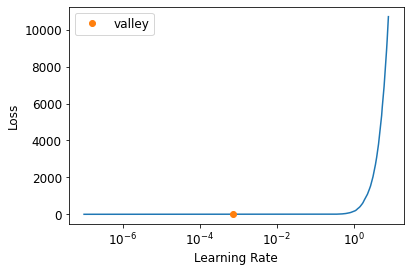

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")

Y ajustamos el modelo con los datos de entrenamiento:

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,7.036784,5.567161,0.013356,0.986644,00:50
1,5.772655,3.974425,0.148581,0.851419,00:49
2,4.145646,2.623197,0.365609,0.634391,00:49
3,3.159442,1.976886,0.487479,0.512521,00:51
4,2.585475,1.688984,0.569282,0.430718,00:49
5,2.292373,1.580528,0.569282,0.430718,00:49
6,2.126401,1.470624,0.614357,0.385643,01:00
7,1.915844,1.384725,0.629382,0.370618,00:54
8,1.827701,1.364312,0.619366,0.380634,00:49
9,1.683662,1.323252,0.661102,0.338898,00:59


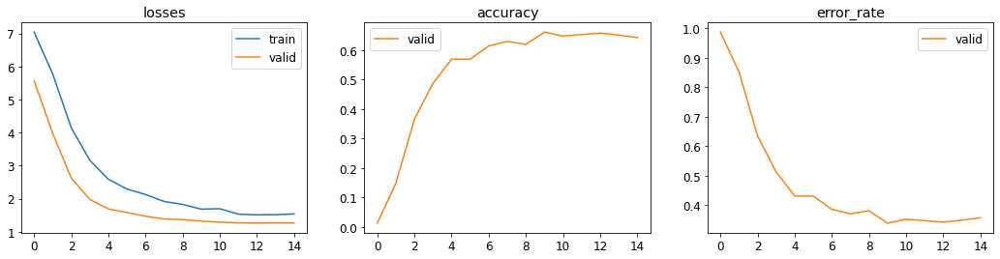

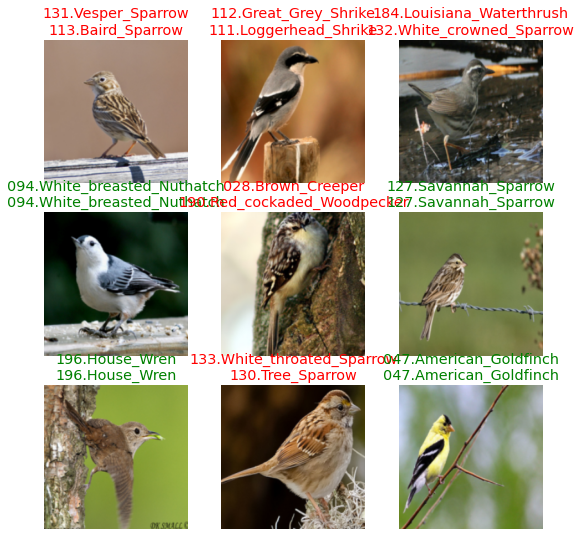

In [ ]:
learn.fit_one_cycle(n_epoch=15, lr_max=lr[0]) # running the optimizer one-cycle
learn.recorder.plot_metrics() # shows accuracy curve along epochs
learn.show_results()

Cálculamos los datos de entrenamiento:

In [ ]:
test_dl = learn.dls.test_dl(files_test, with_labels=True)
print("Size: ", test_dl.n)
print("Number of categories: ", test_dl.c)
print("Categories: ", test_dl.vocab)

Size:  5794
Number of categories:  200
Categories:  ['001.Black_footed_Albatross', '002.Laysan_Albatross', '003.Sooty_Albatross', '004.Groove_billed_Ani', '005.Crested_Auklet', '006.Least_Auklet', '007.Parakeet_Auklet', '008.Rhinoceros_Auklet', '009.Brewer_Blackbird', '010.Red_winged_Blackbird', '011.Rusty_Blackbird', '012.Yellow_headed_Blackbird', '013.Bobolink', '014.Indigo_Bunting', '015.Lazuli_Bunting', '016.Painted_Bunting', '017.Cardinal', '018.Spotted_Catbird', '019.Gray_Catbird', '020.Yellow_breasted_Chat', '021.Eastern_Towhee', '022.Chuck_will_Widow', '023.Brandt_Cormorant', '024.Red_faced_Cormorant', '025.Pelagic_Cormorant', '026.Bronzed_Cowbird', '027.Shiny_Cowbird', '028.Brown_Creeper', '029.American_Crow', '030.Fish_Crow', '031.Black_billed_Cuckoo', '032.Mangrove_Cuckoo', '033.Yellow_billed_Cuckoo', '034.Gray_crowned_Rosy_Finch', '035.Purple_Finch', '036.Northern_Flicker', '037.Acadian_Flycatcher', '038.Great_Crested_Flycatcher', '039.Least_Flycatcher', '040.Olive_sided_Fl

Y obtenemos el accuracy. En este caso, al tener 200 clases, no mostramos las etiquetas en la matriz de confusión ya que apenas se puede distinguir nada, pero podemos ver como la mayoría de valores se encuentran en la diagonal, indicándonos que es un buen modelo.

Number of test examples: 5794


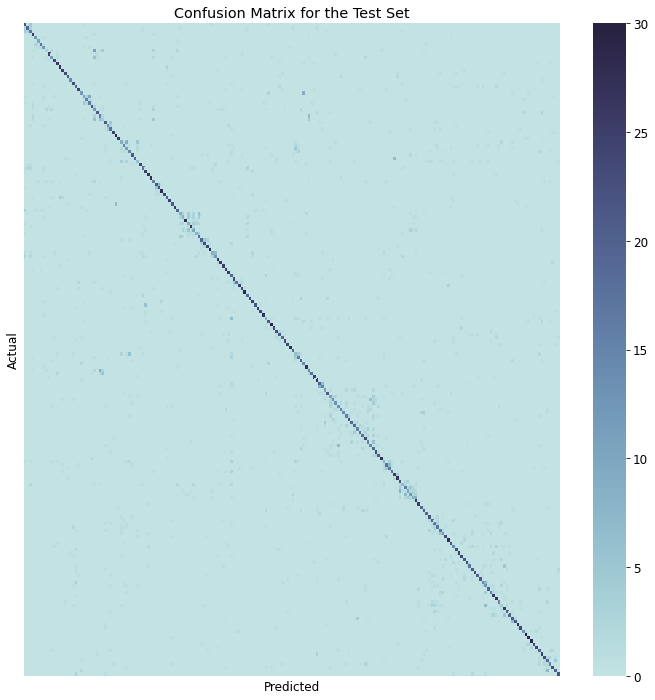

The test accuracy is:  67.3455 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

Por último, volvamos a ver algunas predicciones. Como en este caso tenemos 200 etiquetas, si mostrásemos todos los porcentajes en el histograma, sería casi imposible distinguir nada. Debido a ello, sólo mostramos los 25 más probables.

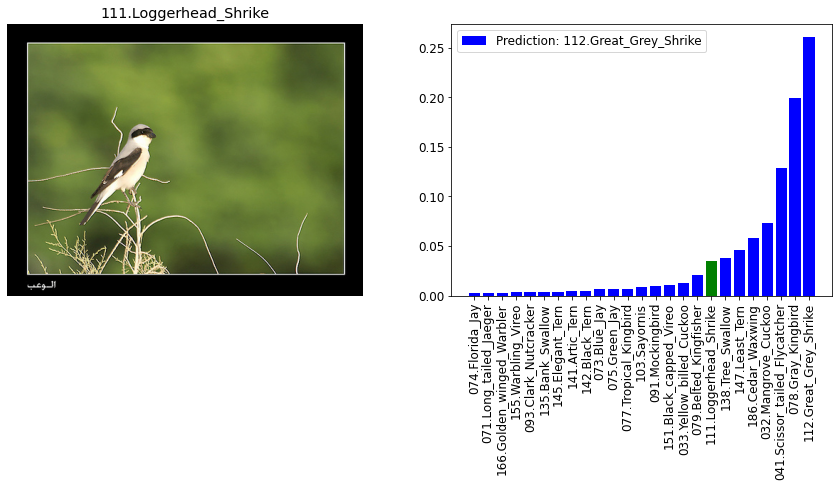

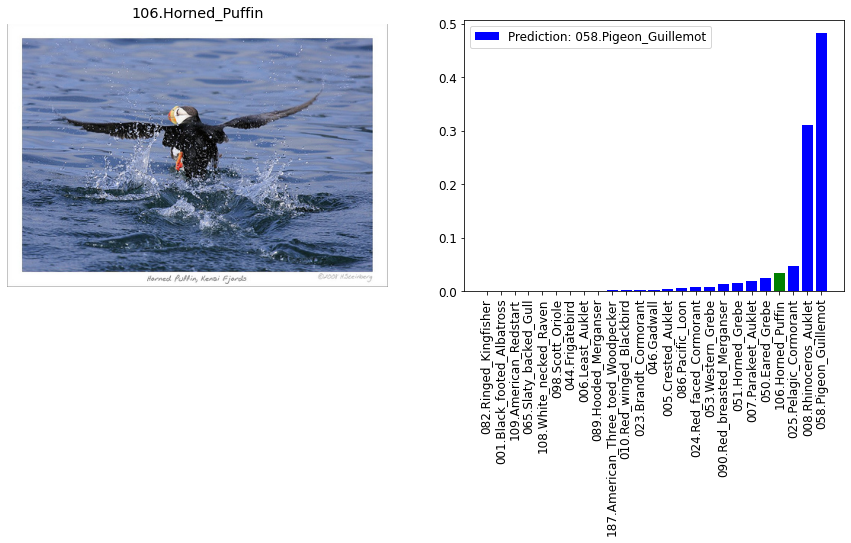

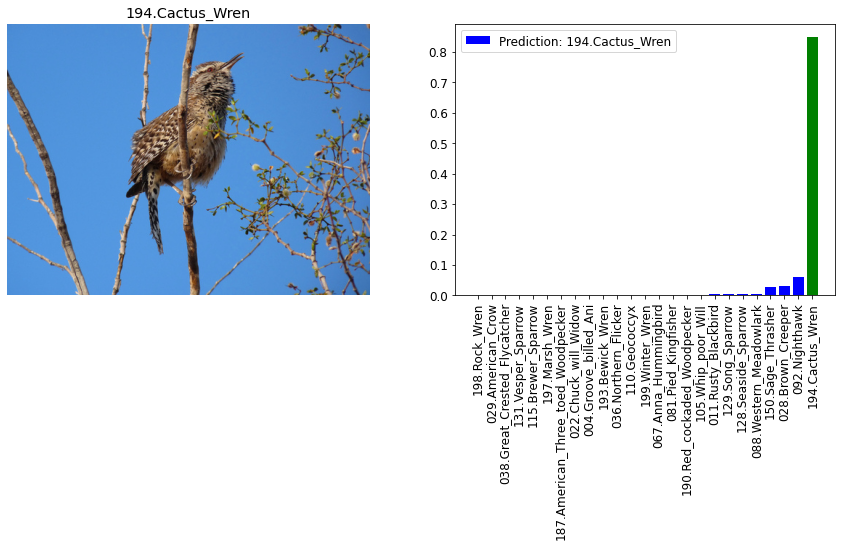

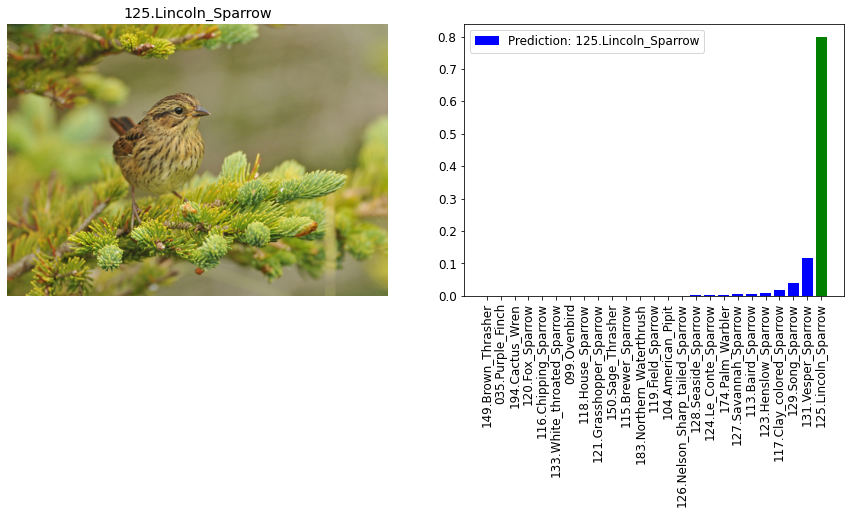

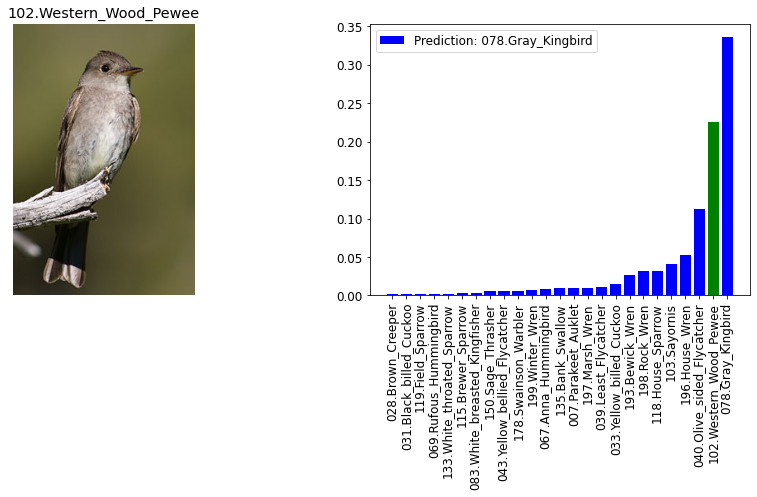

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

Sin embargo, si nos fijamos en el summary realizado previamente, el modelo fastai termina antes de realizar AdaptiveAvgPool2d y AdaptiveMaxPool2d. Estas capas y otras de normalización y softmax son añadidas por vision learner para obtener el mismo número de valores de salida como tenemos de etiquetas.

Debido a ello, vamos a crear una cabeza que añada únicamente la capa totalmente conectada, y obtener así lo que nos solicita el ejercicio.

Para añadir una cabeza, creamos un modelo con Sequential() tal y como hemors realizado previamente, y se la pasamos como parámetro a vision_learner.

In [ ]:
custom_head = nn.Sequential(
    nn.AdaptiveAvgPool2d(output_size=(1,1)),
    nn.Flatten(),
    nn.Linear(in_features=512, out_features=200, bias=True)
)

learn = vision_learner(dls, models.resnet18, custom_head=custom_head, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary() # show all details

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

Calculamos el learning rate para este modelo:

Learning Rate: 0.013182567432522774


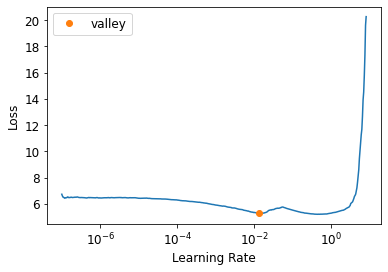

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")

Y entrenamos con los datos de entrenamiento:

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,4.579139,3.513081,0.196995,0.803005,01:02
1,3.236890,3.014149,0.357262,0.642738,00:48
2,3.008385,3.209393,0.342237,0.657763,01:03
3,2.388389,2.325421,0.437396,0.562604,00:52
4,2.147741,2.272384,0.455760,0.544240,00:48
5,1.920619,2.373452,0.437396,0.562604,00:51
6,1.739956,1.920260,0.539232,0.460768,00:48
7,1.507174,1.987247,0.512521,0.487479,00:49
8,1.321762,1.781651,0.565943,0.434057,00:51
9,1.217799,1.600887,0.607679,0.392321,00:48


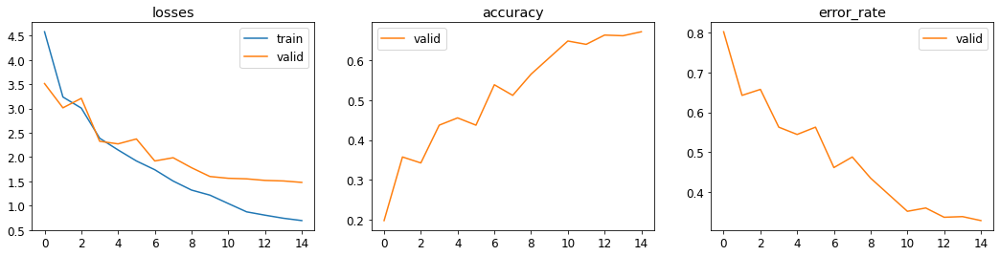

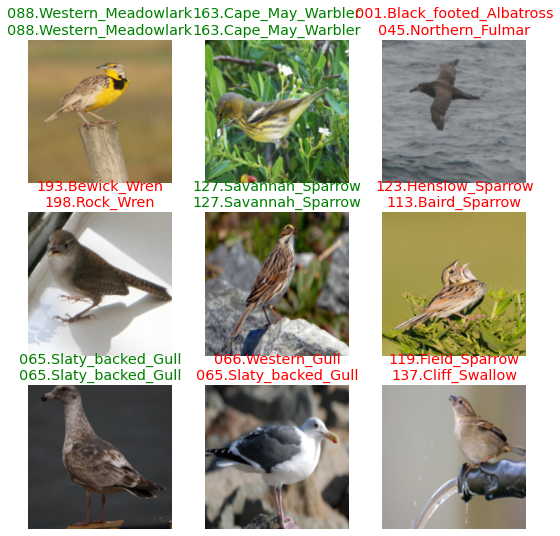

In [ ]:
learn.fit_one_cycle(n_epoch=15, lr_max=lr[0]) # running the optimizer one-cycle
learn.recorder.plot_metrics() # shows accuracy curve along epochs
learn.show_results()

Los resultados que obtenemos son:

Number of test examples: 5794


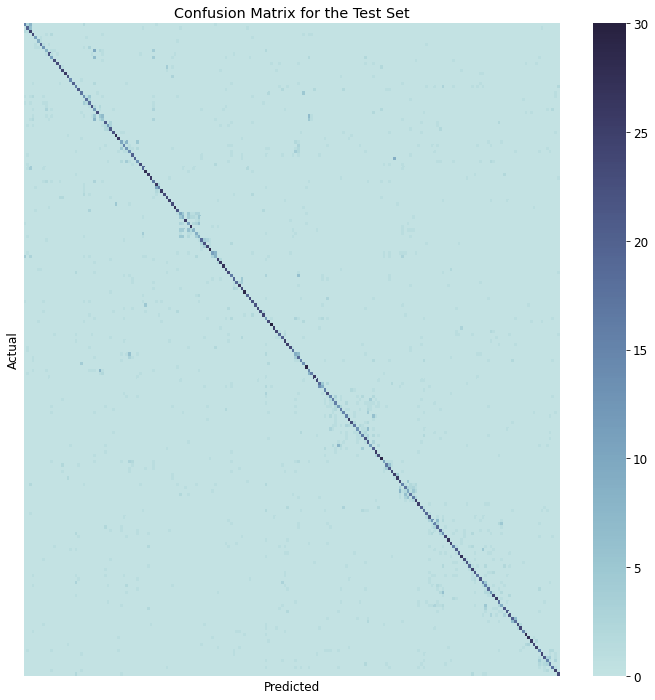

The test accuracy is:  67.4146 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

De nuevo, vamos a visualizar algunas predicciones.

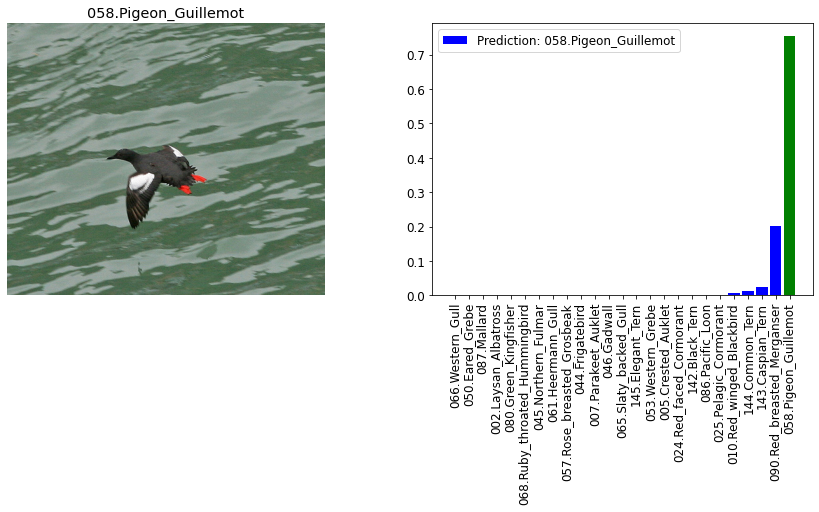

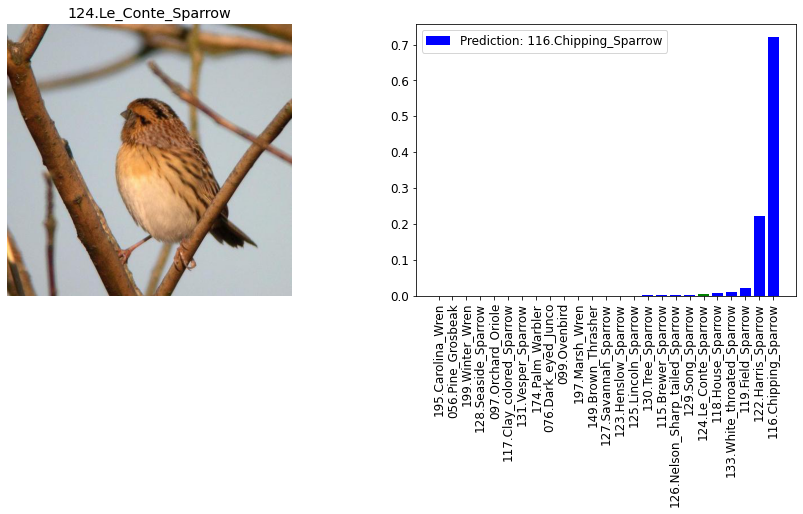

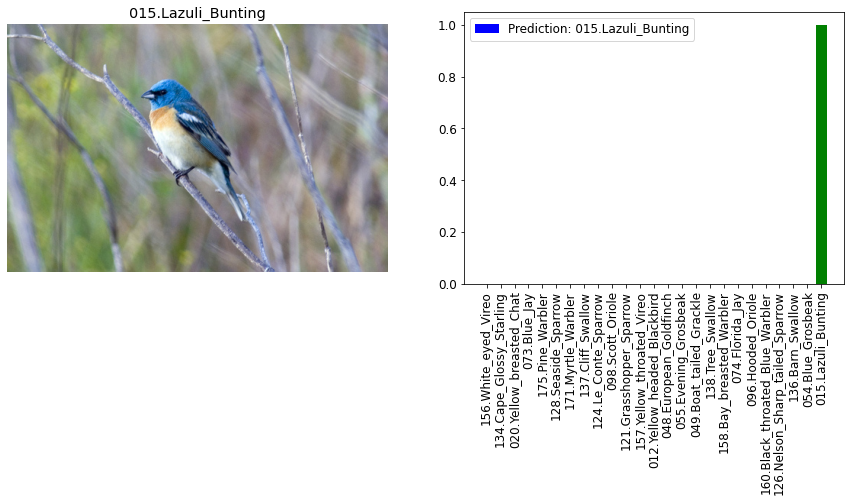

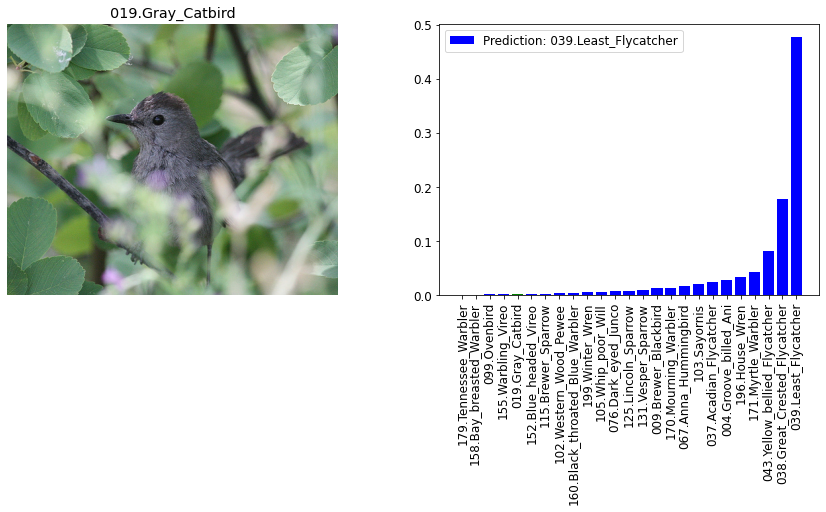

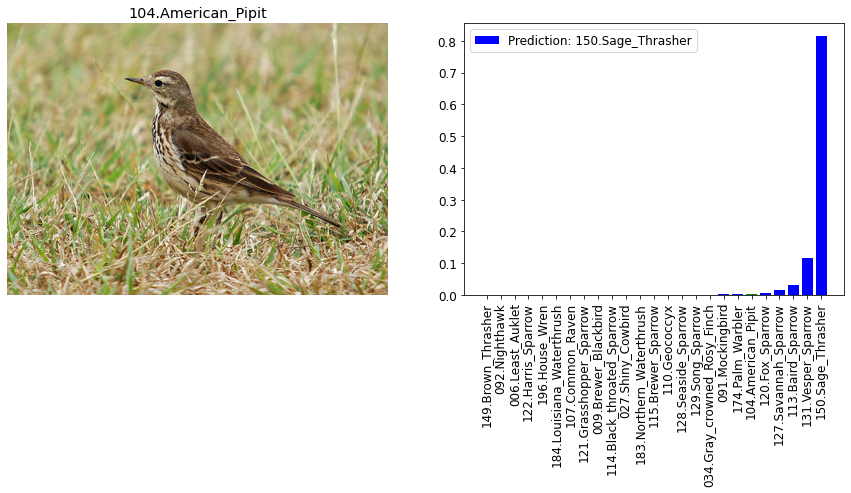

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

### *3.1.2*

Ahora queremos añadir una nueva cabeza al modelo. Comenzamos creando el mismo DataLoader del apartado anterior. Aunque esto no es necesario, ya que no hemos le hemos realizado ninguna modificación, lo vuelvo a añadir para poder ejecutar este apartado individualmente.

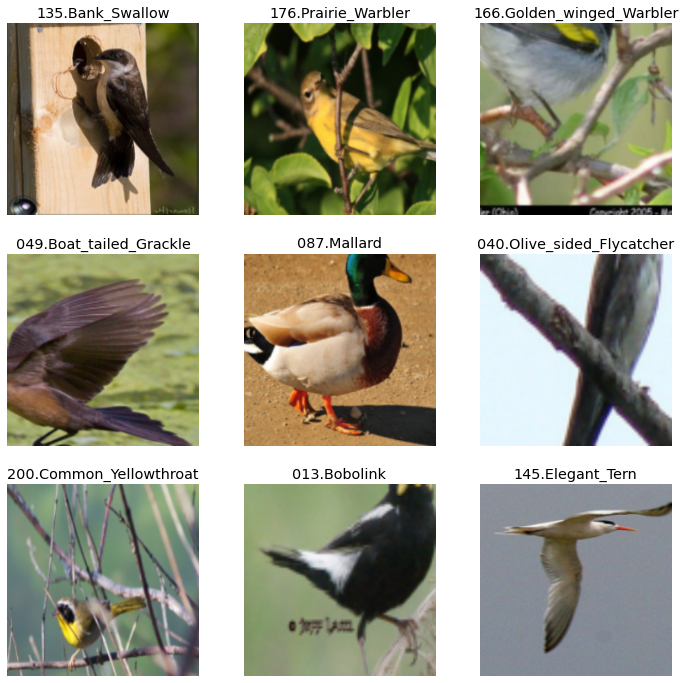

In [ ]:
SEED = 42

dls = DataBlock(
    blocks = (ImageBlock, CategoryBlock), # Input: Image, Output: Category
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.1, seed=SEED),
    get_y = parent_label,
    item_tfms = [Resize(224, method='squish'), RandomResizedCrop(224), FlipItem(0.5)], # Crop and flip images
    batch_tfms = [Normalize.from_stats(*imagenet_stats)]
).dataloaders(path/'train', bs=32)

dls.show_batch(max_n=9, figsize=(12, 12)) # Shows a batch of images

Definimos la nueva cabeza y se la añadimos al modelo (al igual que en los ejercicios anteriores, no añadimos Softmax ya que está implementado por defecto):

In [ ]:
custom_head = nn.Sequential(
    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3)), # Output: 5x5x512
    nn.BatchNorm2d(512),
    nn.ReLU(),

    nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=(3,3)), # Output: 3x3x1024
    nn.BatchNorm2d(1024),
    nn.ReLU(),

    nn.AvgPool2d((3,3)), # Ouput: 1x1x512
    nn.Flatten(), # Output: 512x1
    nn.BatchNorm1d(1024),
    nn.Dropout(),

    nn.Linear(in_features=1024, out_features=512), # Output: 512x1
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(),

    nn.Linear(in_features=512, out_features=200) # Output: 200x1
)

learn = vision_learner(dls, resnet18, custom_head=custom_head, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary() # show all details

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

Calculamos el nuevo Learning Rate:

Learning Rate: 0.0008317637839354575


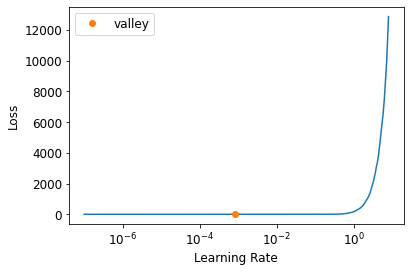

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")

Y volvemos a entrenar el modelo con los datos de entrenamiento:

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,6.485709,4.606404,0.080134,0.919866,00:50
1,5.020384,3.402388,0.223706,0.776294,00:48
2,4.148134,2.594278,0.322204,0.677796,00:48
3,3.550249,2.261556,0.412354,0.587646,00:48
4,3.173914,2.029840,0.447412,0.552588,00:50
5,2.844582,1.980306,0.475793,0.524207,00:48
6,2.567325,1.793018,0.504174,0.495826,00:48
7,2.392645,1.640079,0.545910,0.454090,00:50
8,2.185536,1.530167,0.579299,0.420701,00:47
9,1.979002,1.443912,0.616027,0.383973,00:48


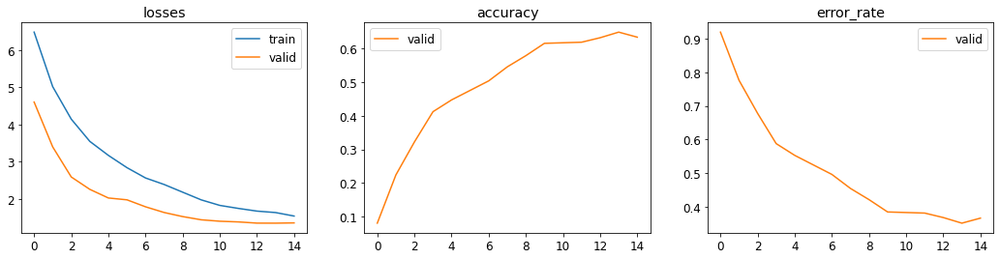

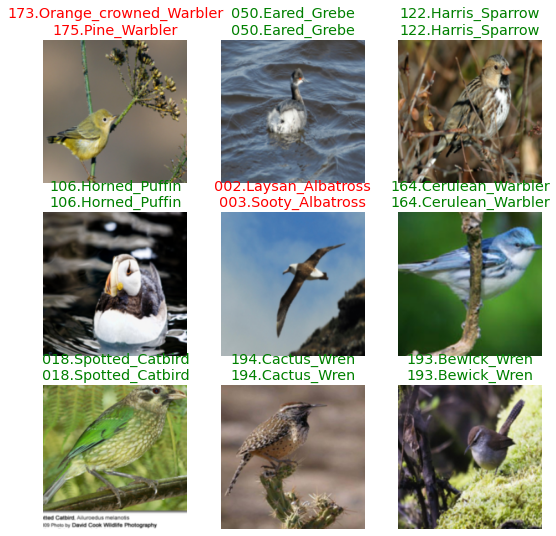

In [ ]:
learn.fit_one_cycle(n_epoch=15, lr_max=lr[0]) # running the optimizer one-cycle
learn.recorder.plot_metrics() # shows accuracy curve along epochs
learn.show_results()

Finalmente, volvemos a predecir los datos de test y calculamos el accuracy:

Number of test examples: 5794


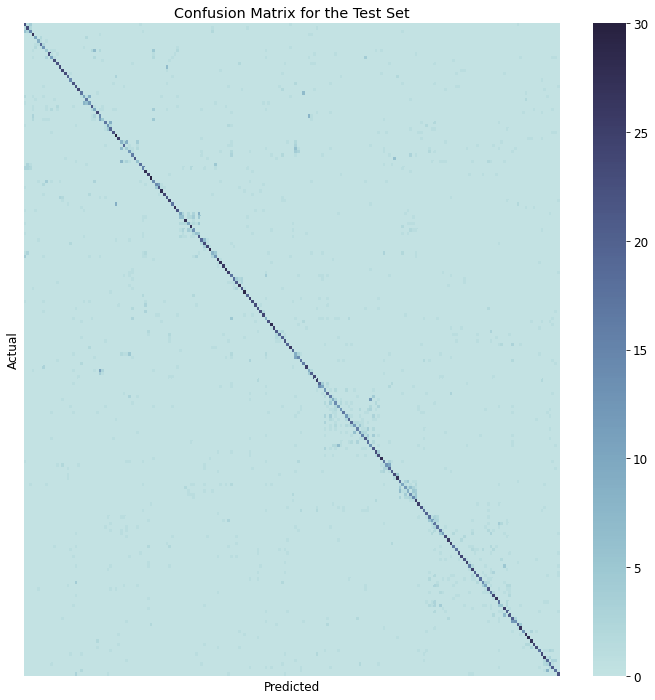

The test accuracy is:  65.5333 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

Visualizamos algunas predicciones.

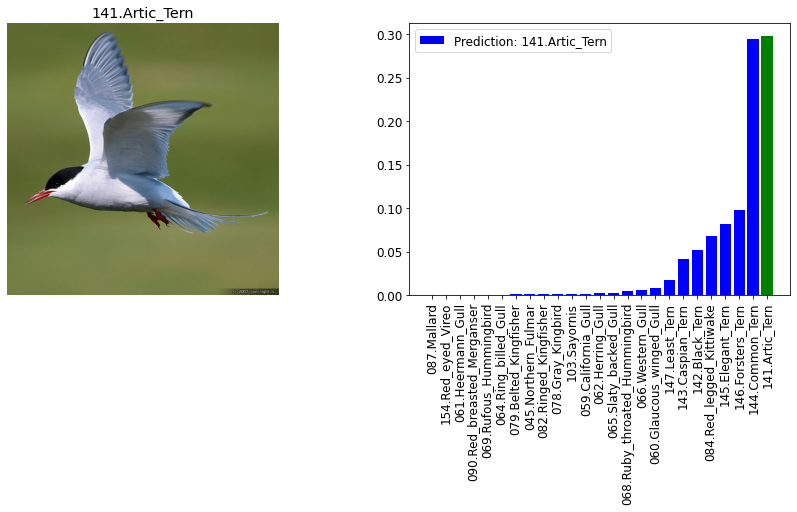

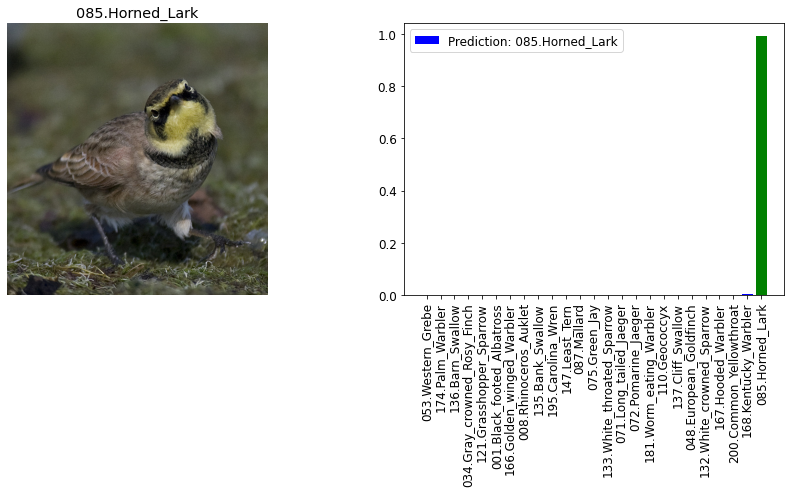

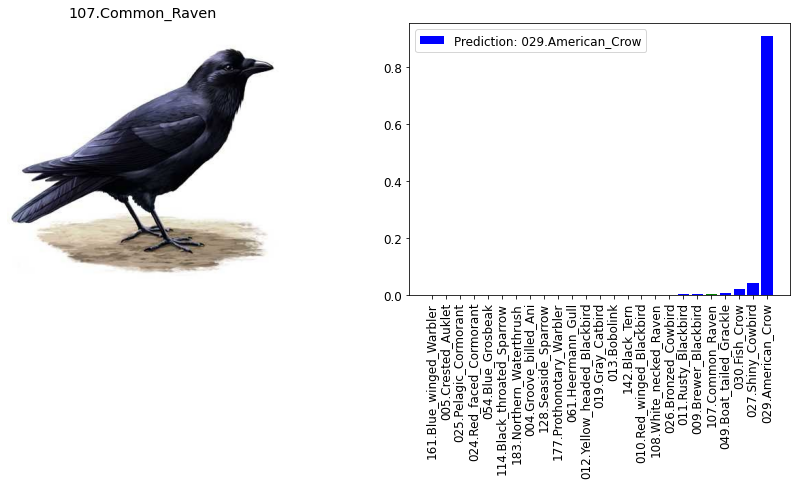

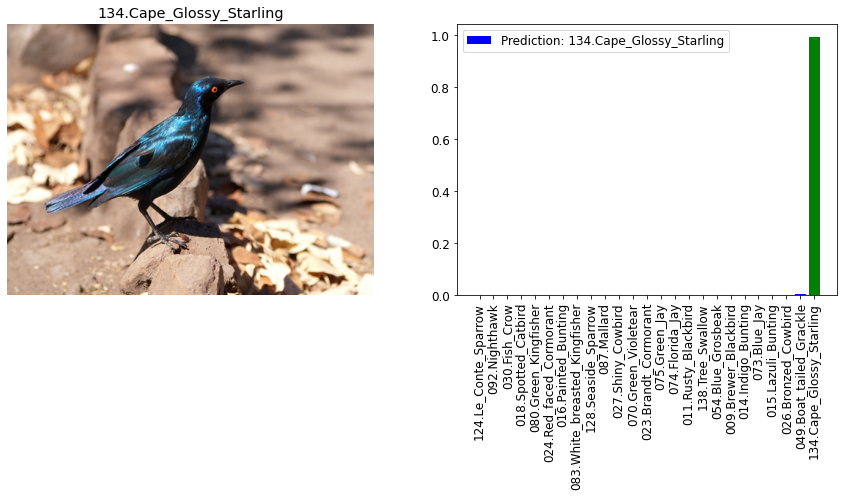

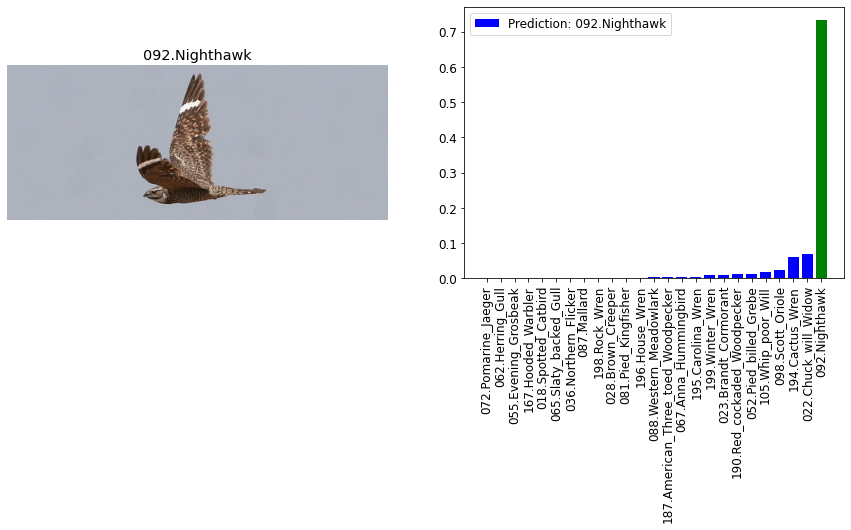

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

### *3.1.3*

Los resultados obtenidos en dos ejecuciones distintas son (nótese que si se vuelve a ejecutar estos tiempos pueden variar debido a la aleatoriedad):
* Cabeza fully-connected:
  * Validation: 69.1152 % / 67.2788 %.
  * Test: 67.6044 % / 67.4146 %.
* Cabeza por defecto de vision_learner:
  * Validation: 68.2805 % / 64.2738 %.
  * Test: 68.174 % / 67.3455 %.
* Cabeza customizada:
  * Validation: 64.9416 % / 63.4391 %.
  * Test: 65.9475 % / 65.5333 %.

Podemos ver que los resultados son inversamente proporcionales a la complejidad de la cabeza añadida, es decir, usando únicamente la capa totalmente conectada y la cabeza por defecto de vision_learner, que es relativamente simple, obtenemos mejores resultados que usando una cabeza customizada.

Esto puede derberse a que el modelo que usamos como base, resnet18, está entrenado para estos datos, por lo añadir más capas no entrenadas únciamente provoca peores resultados.

Aunque la cabeza añadida por resnet es ligeramente más compleja que la únicamente totalmente conectada, los resultados son casi iguales. Esto se debe a que, la cabeza por defecto de vision_learner es una fully_conected a la que añade normalización y dropout, pasos que pueden mejorar el modelo en entrenamiento.

Nótese que podríamos obtener resultados más consistentes usando CrossValidation(). Sin embargo, viendo los tiempos de ejecución, cada entrenamiento son cerca de 10-15 min, así que el tiempo podría facilmente superar la hora de ejecución.
Sin embargo, todas las conclusiones obtenidas en este ejercicio son consistentes en varias ejecuciones realizadas del ejercicio, aunque los porcentajes varían ligeramente.

### *3.2*

Comencemos utilizando el modelo con la cabeza definida en el apartado 3.1.2:

In [ ]:
custom_head = nn.Sequential(
    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3)), # Output: 5x5x512
    nn.BatchNorm2d(512),
    nn.ReLU(),

    nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=(3,3)), # Output: 3x3x1024
    nn.BatchNorm2d(1024),
    nn.ReLU(),

    nn.AvgPool2d((3,3)), # Ouput: 1x1x512
    nn.Flatten(), # Output: 512x1
    nn.BatchNorm1d(1024),
    nn.Dropout(),

    nn.Linear(in_features=1024, out_features=512), # Output: 512x1
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(),

    nn.Linear(in_features=512, out_features=200) # Output: 200x1
)

learn = vision_learner(dls, resnet18, custom_head=custom_head, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary()

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

Learning Rate: 0.0006194410962052643


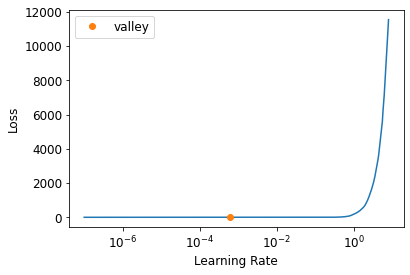

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")

Para hacer el fine-tuning, utilizamos la función fine_tune de fastai, que entrena la cabeza una serie de iteraciones sin modificar el modelo base (dejándolo congelado), y luego entrena todo el modelo descongelando las capas previamente congeladas. En nuestro caso, vamos a usar 5 épocas con el modelo congelado, y 10 con el modelo descongelado:

In [ ]:
learn.fine_tune(10, freeze_epochs=5, base_lr=lr[0])

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,6.839022,5.083528,0.045075,0.954925,00:54
1,5.657885,3.782709,0.176962,0.823038,00:52
2,4.668589,3.025831,0.260434,0.739566,00:52
3,3.999728,2.698731,0.327212,0.672788,00:48
4,3.637924,2.417389,0.370618,0.629382,00:48


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,3.137407,2.023205,0.470785,0.529215,00:53
1,2.872146,1.887094,0.494157,0.505843,00:50
2,2.651713,1.817999,0.507513,0.492487,00:50
3,2.485447,1.654563,0.545910,0.454090,00:52
4,2.264910,1.586557,0.564274,0.435726,00:50
5,2.071431,1.477191,0.584307,0.415693,00:50
6,1.854435,1.411572,0.594324,0.405676,00:52
7,1.822539,1.373407,0.607679,0.392321,00:50
8,1.741166,1.373743,0.609349,0.390651,00:50
9,1.672353,1.373338,0.602671,0.397329,00:53


Number of test examples: 5794


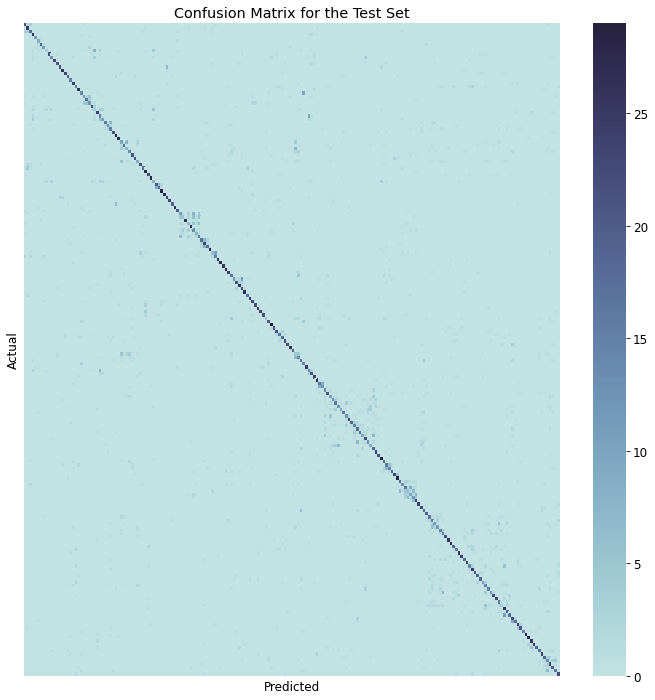

The test accuracy is:  64.3079 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

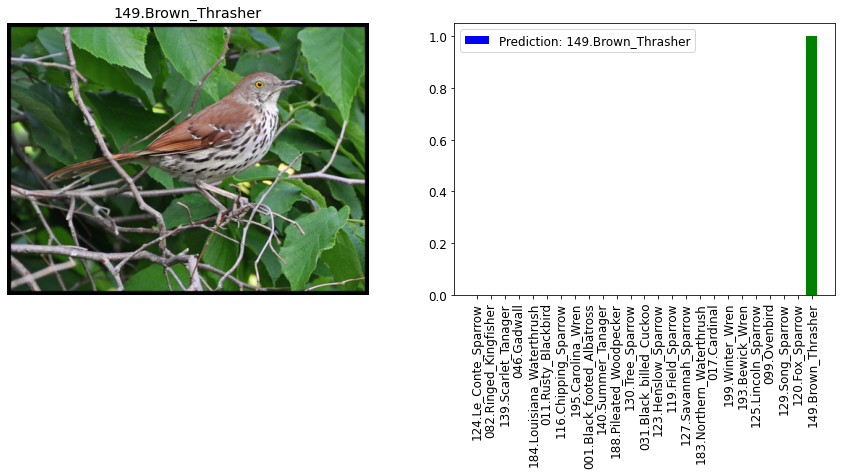

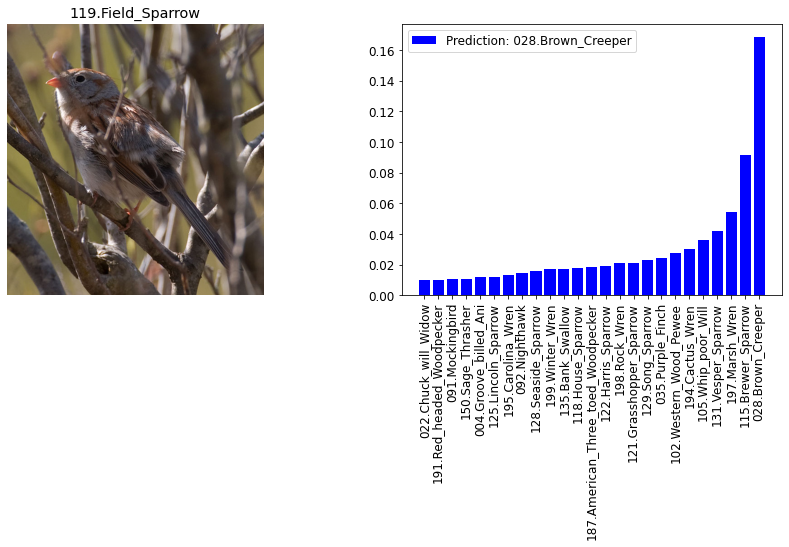

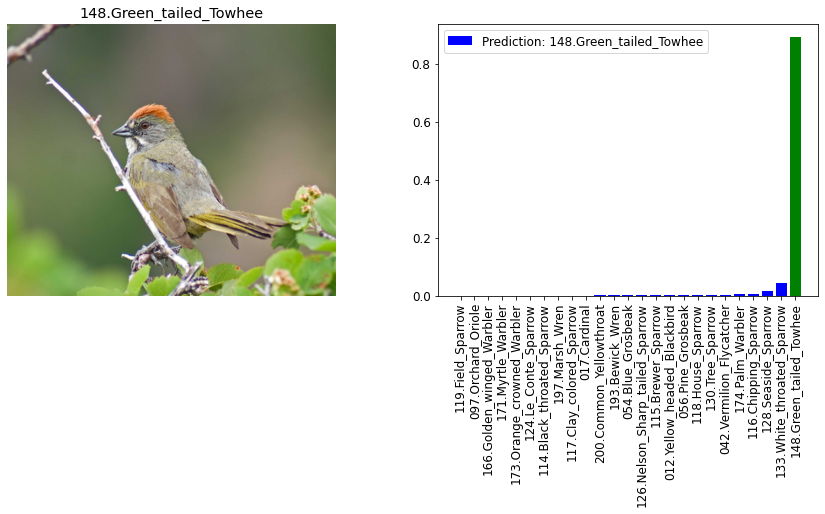

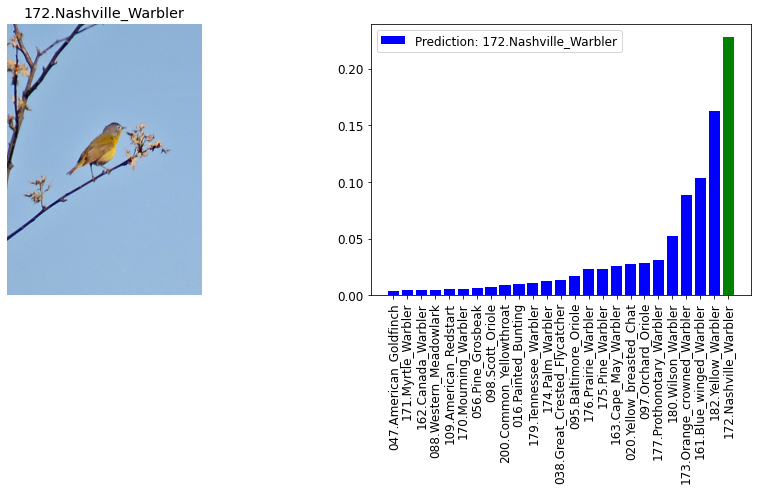

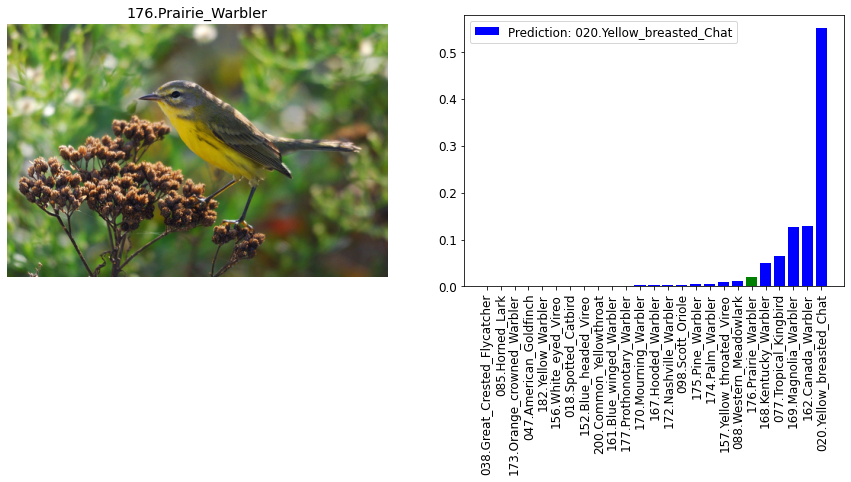

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

Otra forma de realizar el ejercicio es realizar el fine-tuning de forma manual, ya que si vemos la definición de fine_tune tenemos:

In [ ]:
#def fine_tune(self:Learner, epochs, base_lr=2e-3, freeze_epochs=1, lr_mult=100,
#              pct_start=0.3, div=5.0, **kwargs):
#    "Fine tune with `Learner.freeze` for `freeze_epochs`, then with `Learner.unfreeze` for `epochs`, using discriminative LR."
#    self.freeze()
#    self.fit_one_cycle(freeze_epochs, slice(base_lr), pct_start=0.99, **kwargs)
#    base_lr /= 2
#    self.unfreeze()
#    self.fit_one_cycle(epochs, slice(base_lr/lr_mult, base_lr), pct_start=pct_start, div=div, **kwargs)

(Dejo el código comentado para no sobreescribir la función). Si nos fijamos, lo que realiza es congelar el modelo, entrenar la cabeza, descongelar el modelo y entrenarlo entero.

Vamos a realizarlo nosotros manualmente. Para ello, volvemos a cargar los datos y crear el modelo:

In [ ]:
custom_head = nn.Sequential(
    nn.Conv2d(in_channels=512, out_channels=512, kernel_size=(3,3)), # Output: 5x5x512
    nn.BatchNorm2d(512),
    nn.ReLU(),

    nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=(3,3)), # Output: 3x3x1024
    nn.BatchNorm2d(1024),
    nn.ReLU(),

    nn.AvgPool2d((3,3)), # Ouput: 1x1x512
    nn.Flatten(), # Output: 512x1
    nn.BatchNorm1d(1024),
    nn.Dropout(),

    nn.Linear(in_features=1024, out_features=512), # Output: 512x1
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(),

    nn.Linear(in_features=512, out_features=200) # Output: 200x1
)

learn = vision_learner(dls, resnet18, custom_head=custom_head, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary()

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

Sin embargo, esta vez, en lugar de usar fine_tune, congelamos el modelo (ya está congelado por defecto al usar vision_learner), entrenamos con el modelo congelado (entrenando la cabeza), y luego descongelamos el modelo para volver a entrenarlo:

In [ ]:
# Frozen model
learn.freeze()
print(f"Learning Rate: {lr[0]}")
learn.fit_one_cycle(n_epoch=5, lr_max=lr[0]) # running the optimizer one-cycle

# Unfrozen model
learn.unfreeze()
learn.fit_one_cycle(n_epoch=10, lr_max=lr[0]) # running the optimizer one-cycle

Learning Rate: 0.0006194410962052643


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,5.944375,4.019396,0.173623,0.826377,00:48
1,4.451220,2.776511,0.310518,0.689482,00:48
2,3.648784,2.271617,0.425710,0.574290,00:49
3,3.153233,1.923720,0.497496,0.502504,00:50
4,2.841227,1.876662,0.510851,0.489149,00:48


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.986899,2.094047,0.449082,0.550918,00:50
1,3.836969,3.175333,0.227045,0.772955,00:53
2,3.990712,3.497984,0.181970,0.818030,00:50
3,3.749488,3.007209,0.238731,0.761269,00:51
4,3.370656,2.793595,0.328881,0.671119,00:53
5,2.973294,1.952134,0.455760,0.544240,00:51
6,2.522630,1.701796,0.522538,0.477462,00:51
7,2.166343,1.413582,0.606010,0.393990,00:52
8,1.952170,1.288357,0.637730,0.362270,00:50
9,1.809639,1.267809,0.636060,0.363940,00:50


Number of test examples: 5794


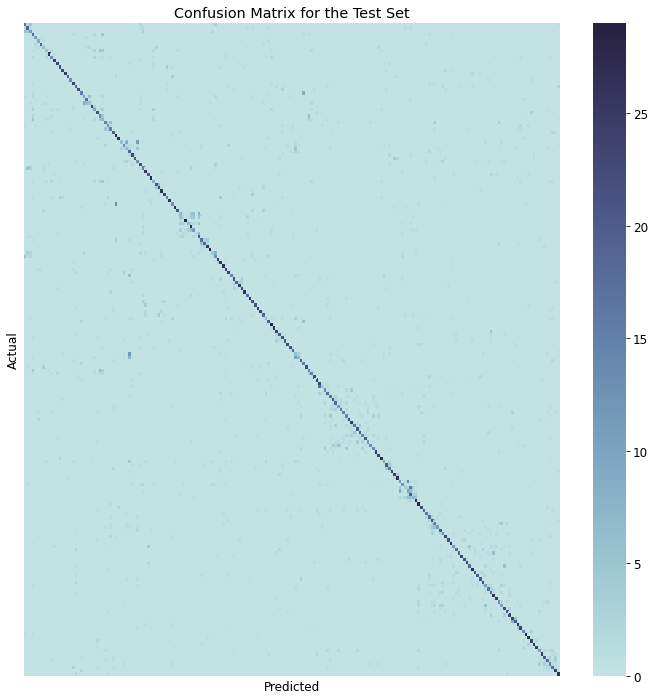

The test accuracy is:  64.7049 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

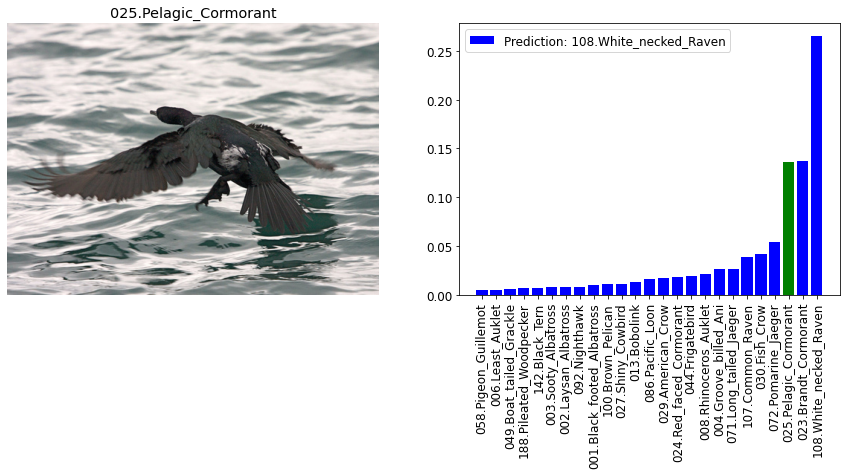

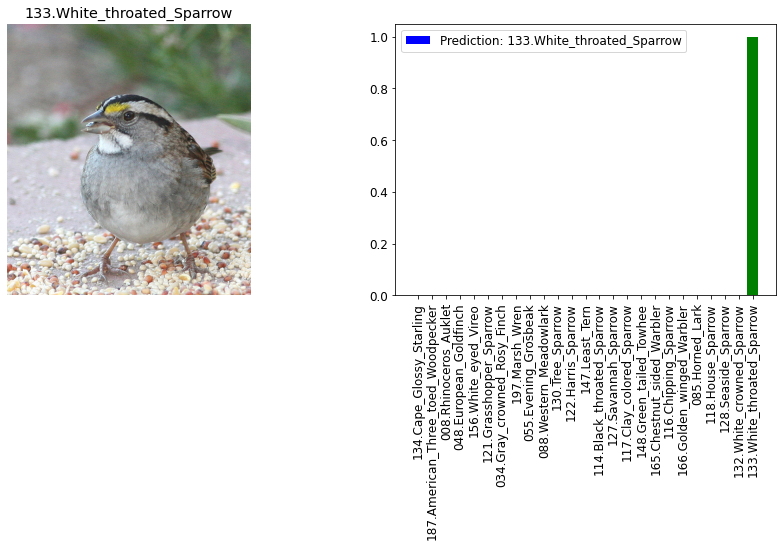

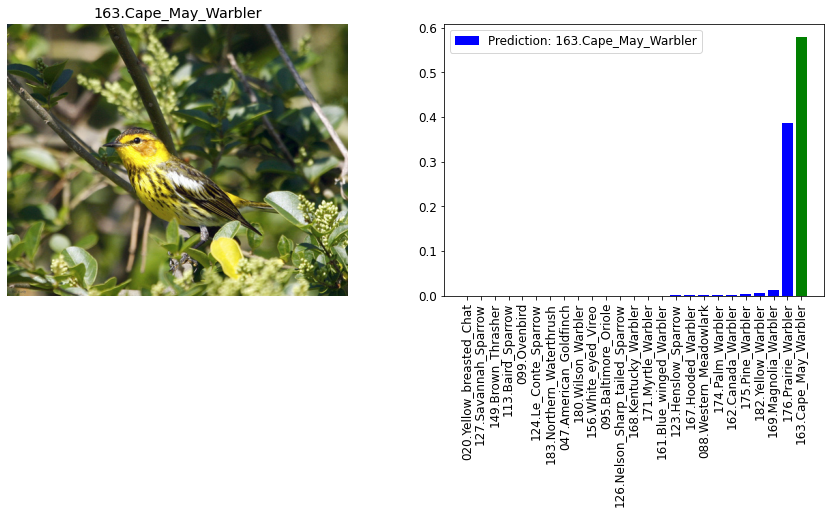

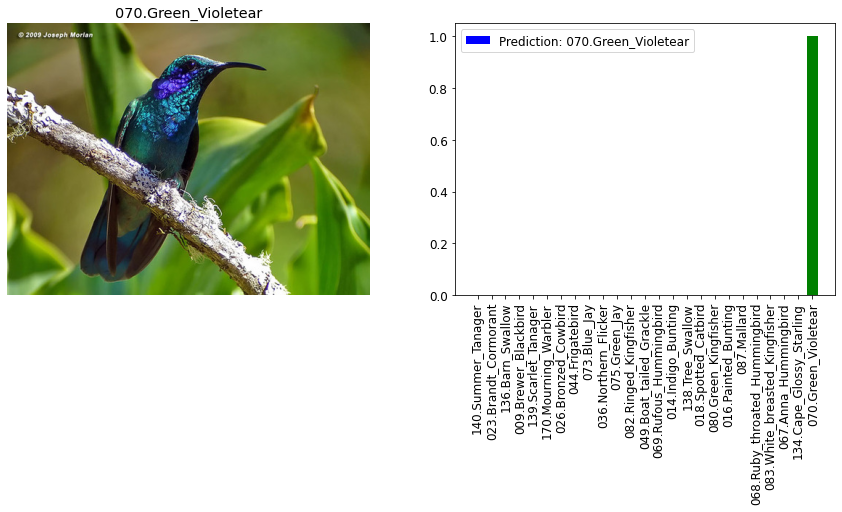

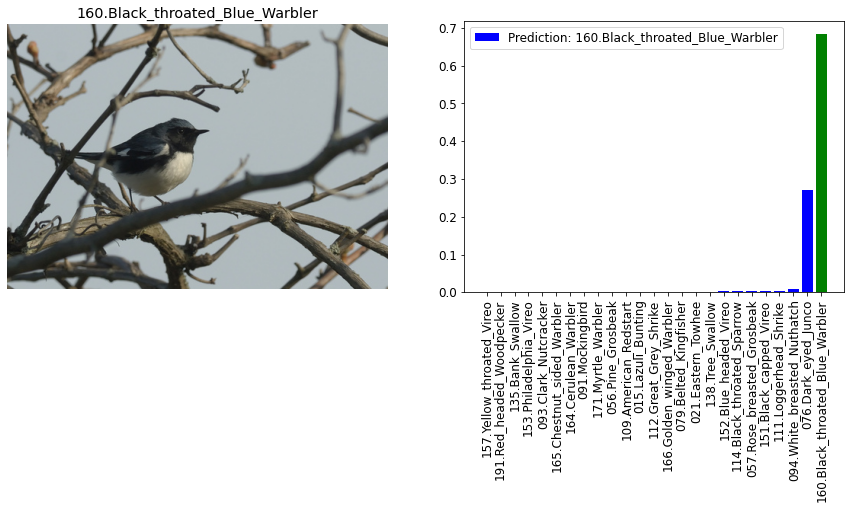

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

Nótese que los valores no coinciden exactamente debido a la aleatoriedad, y a que yo no he realizado ninguna modificación al learning rate, cosa que si se hace en fine_tune.

Vamos a probar también la cabeza que vision_learner() nos da por defecto:

In [ ]:
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary()

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

Learning Rate: 0.0010764652397483587


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,6.966443,5.458719,0.013356,0.986644,00:47
1,5.834852,4.125143,0.138564,0.861436,00:50
2,4.330205,2.854120,0.332220,0.667780,00:47
3,3.393573,2.182937,0.440735,0.559265,00:48
4,2.808494,1.896822,0.479132,0.520868,00:49


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.380876,1.706816,0.552588,0.447412,00:49
1,2.134157,1.592493,0.570952,0.429048,00:49
2,2.087655,1.523500,0.577629,0.422371,00:52
3,1.827656,1.407930,0.626043,0.373957,00:49
4,1.708134,1.306938,0.644407,0.355593,00:49
5,1.492808,1.272208,0.652755,0.347245,00:52
6,1.387162,1.241751,0.646077,0.353923,00:49
7,1.323036,1.213106,0.664441,0.335559,00:49
8,1.249840,1.201763,0.664441,0.335559,00:52
9,1.224440,1.200885,0.672788,0.327212,00:49


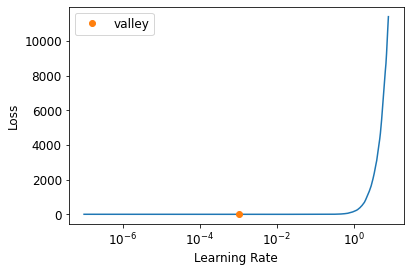

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")
learn.fine_tune(10, freeze_epochs=5, base_lr=lr[0])

Number of test examples: 5794


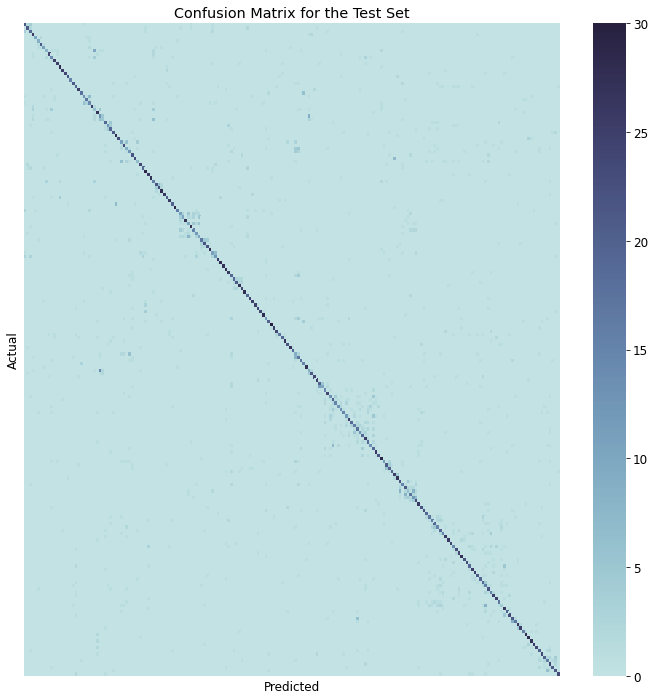

The test accuracy is:  69.3131 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

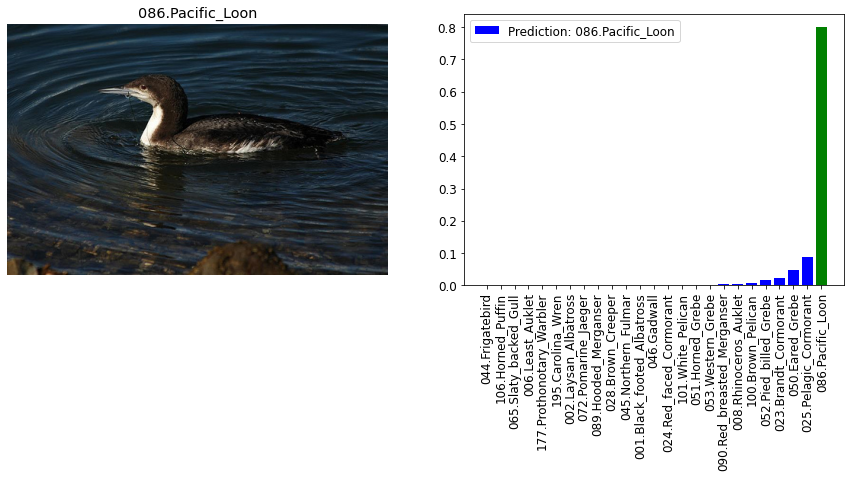

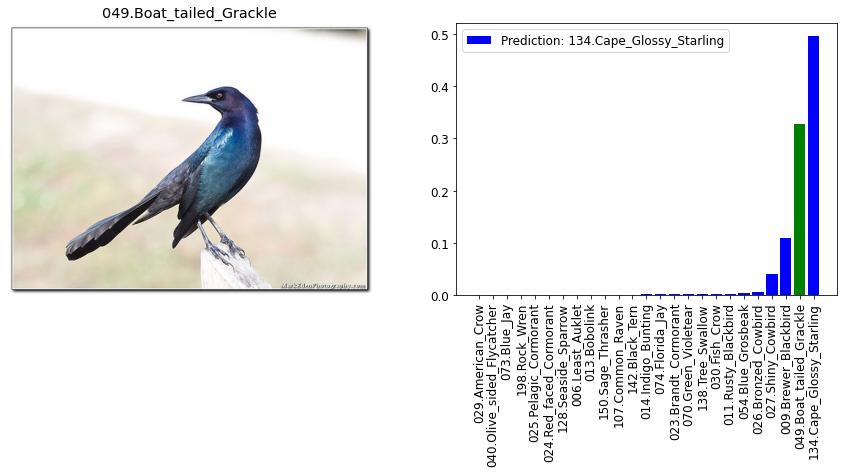

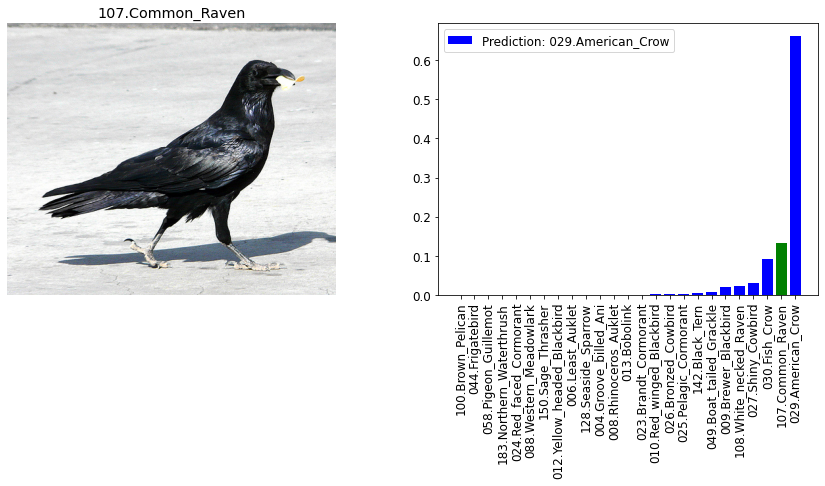

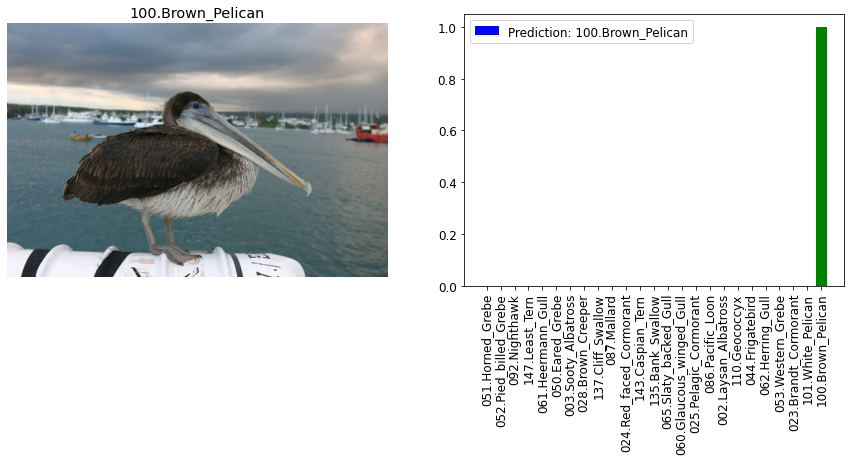

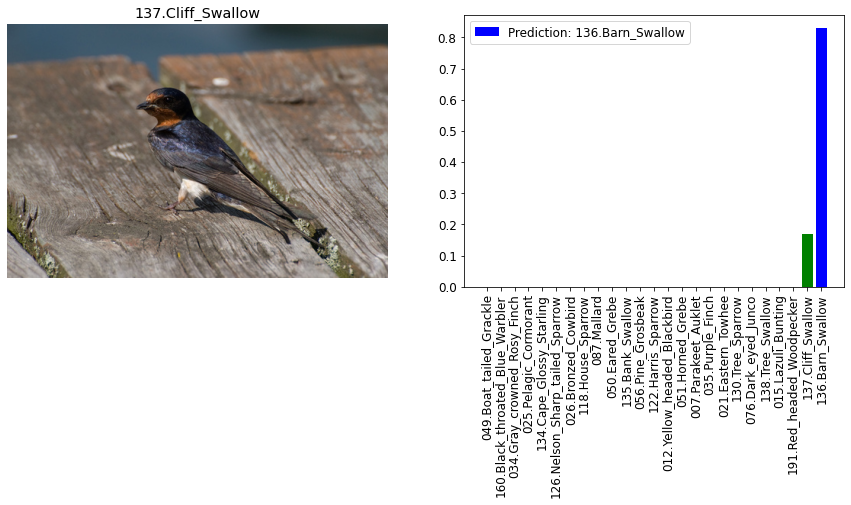

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

También podemos probar esta máscara que tenemos por defecto congelando y descongelando el modelo manualmente:

In [ ]:
learn = vision_learner(dls, resnet18, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary()

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,6.099798,4.144734,0.118531,0.881469,00:49
1,4.005159,2.437453,0.402337,0.597663,00:47
2,3.063685,1.912351,0.514190,0.485810,00:47
3,2.575357,1.742918,0.562604,0.437396,00:47
4,2.422494,1.714019,0.567613,0.432387,00:50


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.602677,1.956414,0.492487,0.507513,00:49
1,3.430558,2.998493,0.270451,0.729549,00:50
2,3.457420,2.609303,0.320534,0.679466,00:52
3,3.175526,3.018538,0.277129,0.722871,00:50
4,2.841158,2.065690,0.442404,0.557596,00:49
5,2.423215,1.670418,0.515860,0.484140,00:49
6,2.023995,1.411455,0.604341,0.395659,00:52
7,1.725807,1.215278,0.661102,0.338898,00:50
8,1.464593,1.117797,0.677796,0.322204,00:50
9,1.395928,1.114398,0.677796,0.322204,00:52


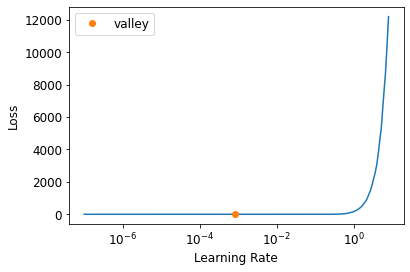

In [ ]:
# Frozen model
learn.freeze()
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
learn.fit_one_cycle(n_epoch=5, lr_max=lr[0]) # running the optimizer one-cycle

# Unfrozen model
learn.unfreeze()
learn.fit_one_cycle(n_epoch=10, lr_max=lr[0]) # running the optimizer one-cycle

Number of test examples: 5794


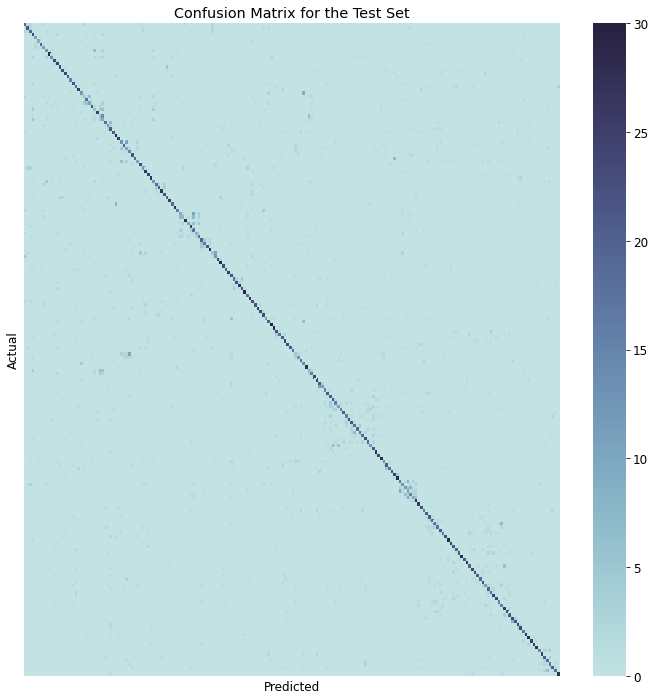

The test accuracy is:  68.243 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

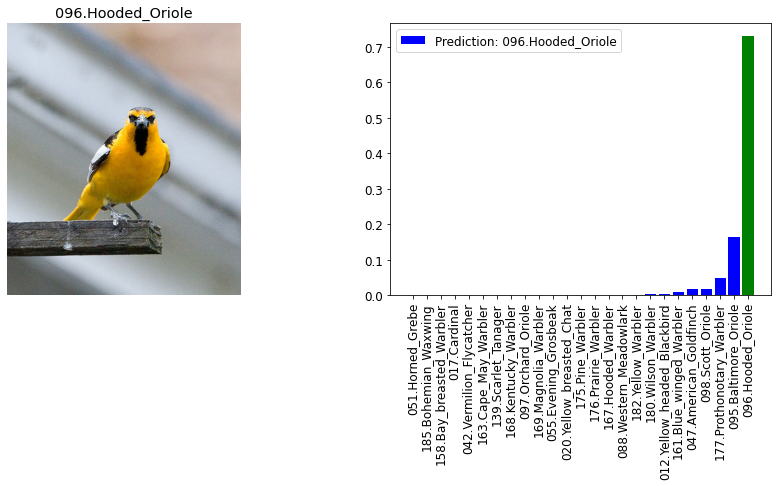

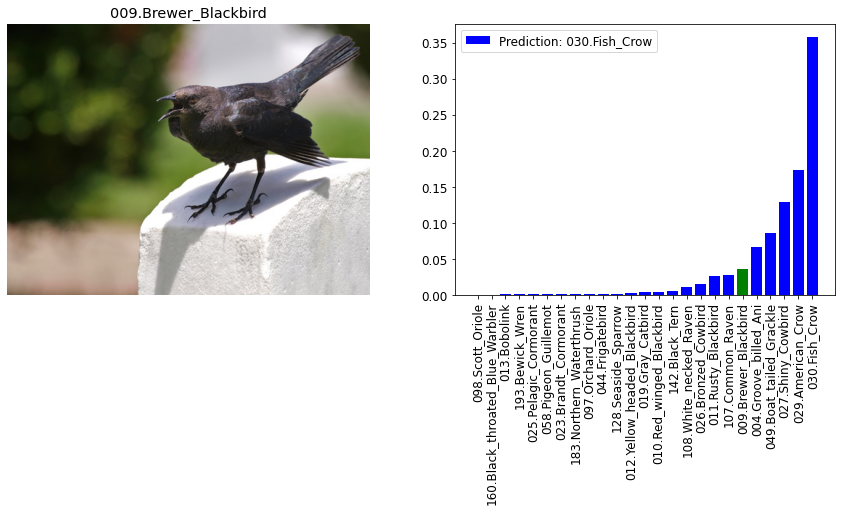

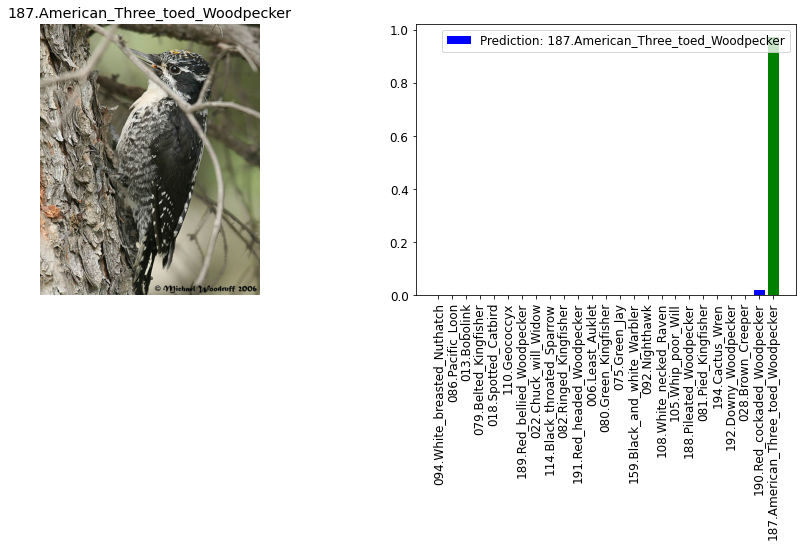

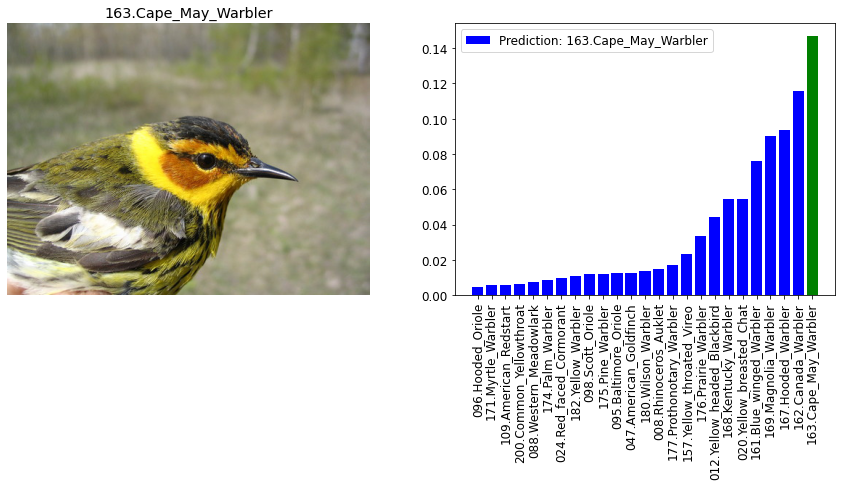

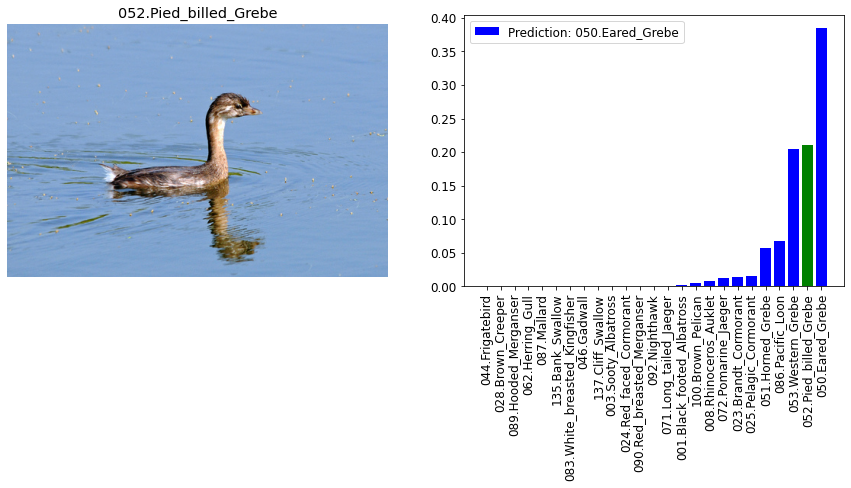

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

Por último, veamos que obtenemos con la cabeza que es una capa totalmente conectada:

In [ ]:
custom_head = nn.Sequential(
    nn.AdaptiveAvgPool2d(output_size=(1,1)),
    nn.Flatten(),
    nn.Linear(in_features=512, out_features=200, bias=True)
)

learn = vision_learner(dls, models.resnet18, custom_head=custom_head, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary() # show all details

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

Learning Rate: 0.015848932787775993


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,4.743577,3.969696,0.131886,0.868114,00:47
1,3.318613,3.052252,0.363940,0.636060,00:49
2,3.402997,3.862962,0.388982,0.611018,00:48
3,3.867631,3.742673,0.435726,0.564274,00:47
4,3.672835,4.777501,0.444073,0.555927,00:47


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.088048,2.704525,0.457429,0.542571,00:52
1,2.936581,5.403122,0.307179,0.692821,00:50
2,3.330023,3.796442,0.357262,0.642738,00:49
3,2.693799,3.171742,0.397329,0.602671,00:52
4,2.262840,2.329894,0.500835,0.499165,00:50
5,1.726525,1.846204,0.565943,0.434057,00:49
6,1.361920,1.536626,0.616027,0.383973,00:50
7,0.940508,1.379891,0.667780,0.332220,00:52
8,0.751690,1.322407,0.712855,0.287145,00:49
9,0.666964,1.302167,0.709516,0.290484,00:49


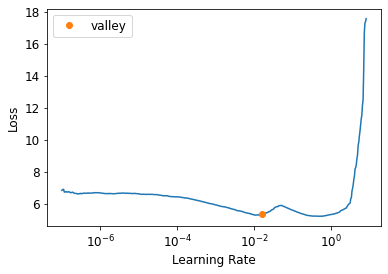

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=500) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")
learn.fine_tune(10, freeze_epochs=5, base_lr=lr[0])

Number of test examples: 5794


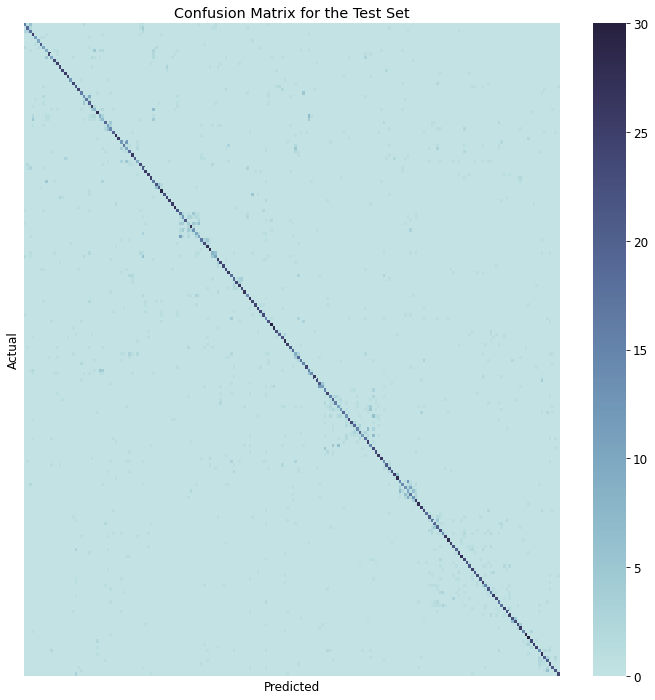

The test accuracy is:  70.2623 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

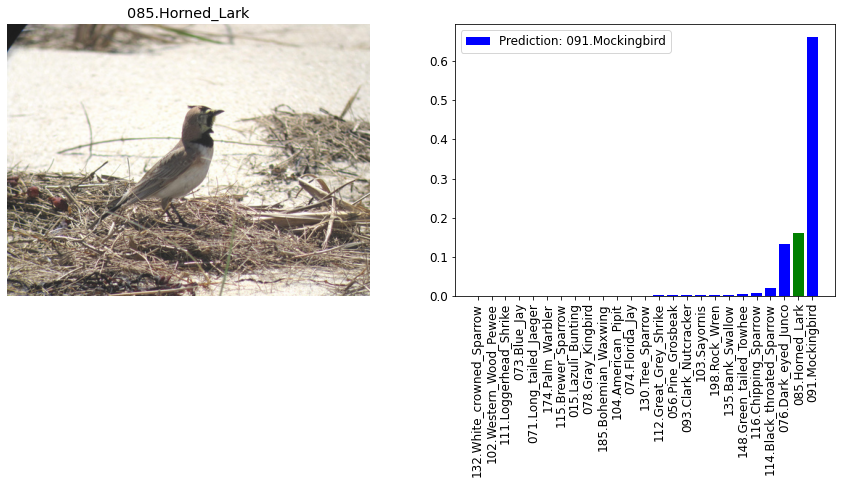

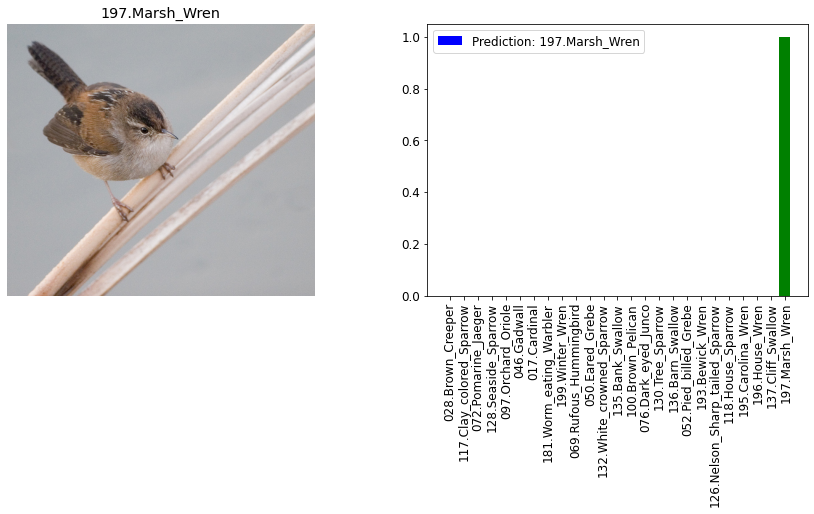

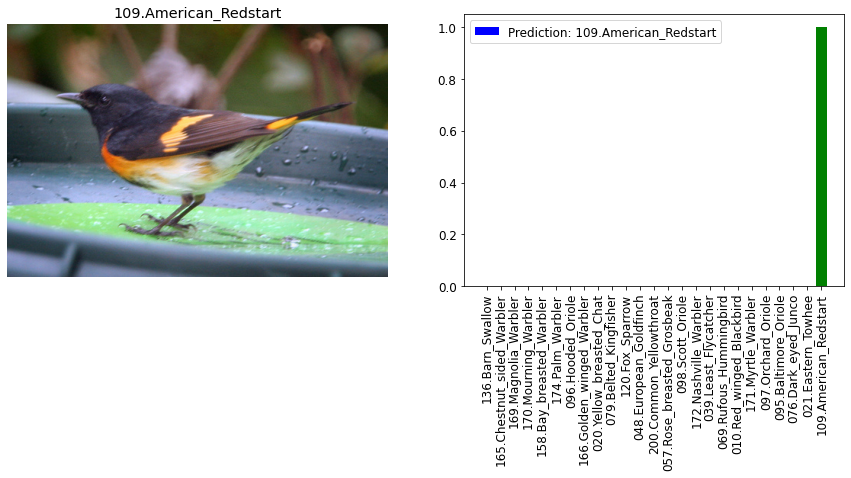

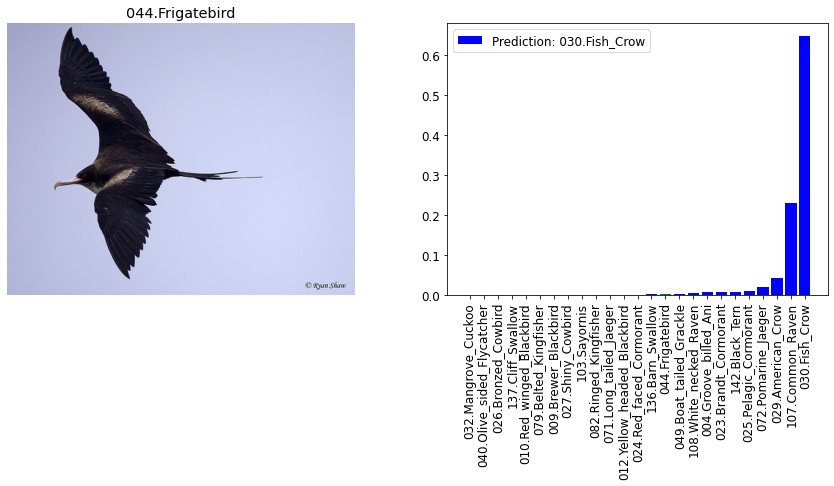

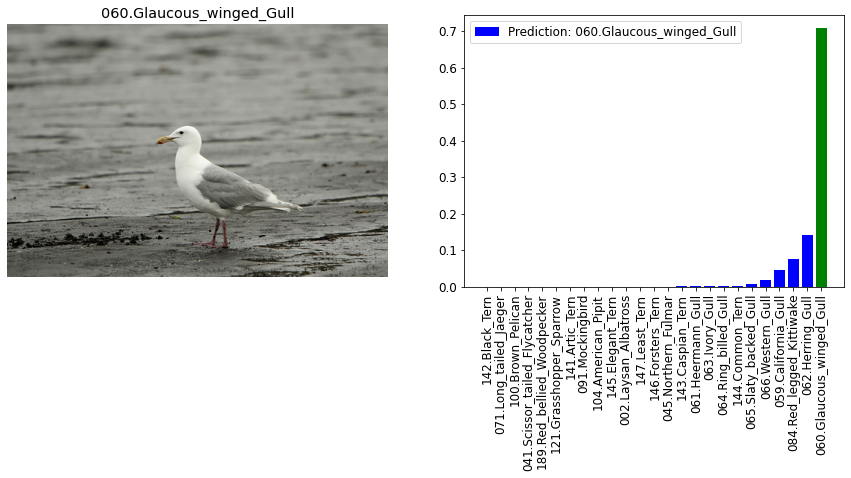

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

Y haciendo el fine-tuning de forma manual:

In [ ]:
custom_head = nn.Sequential(
    nn.AdaptiveAvgPool2d(output_size=(1,1)),
    nn.Flatten(),
    nn.Linear(in_features=512, out_features=200, bias=True)
)

learn = vision_learner(dls, models.resnet18, custom_head=custom_head, loss_func=CrossEntropyLossFlat(), metrics=[accuracy, error_rate])
learn.summary() # show all details

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

In [ ]:
# Frozen model
learn.freeze()
print(f"Learning Rate: {lr[0]}")
learn.fit_one_cycle(n_epoch=5, lr_max=lr[0]) # running the optimizer one-cycle

# Unfrozen model
learn.unfreeze()
learn.fit_one_cycle(n_epoch=10, lr_max=lr[0]) # running the optimizer one-cycle

Learning Rate: 0.0008317637839354575


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,5.462250,4.957441,0.051753,0.948247,00:50
1,3.862733,3.154506,0.248748,0.751252,00:47
2,2.853793,2.410239,0.397329,0.602671,00:48
3,2.446602,2.148436,0.480801,0.519199,00:50
4,2.282211,2.103134,0.490818,0.509182,00:47


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.157328,2.154745,0.414023,0.585977,00:49
1,2.483632,2.911769,0.307179,0.692821,00:51
2,2.560143,2.668982,0.360601,0.639399,00:49
3,2.322133,2.574096,0.373957,0.626043,00:49
4,1.875895,2.021395,0.455760,0.544240,00:50
5,1.576426,1.614105,0.572621,0.427379,00:51
6,1.161010,1.303824,0.632721,0.367279,00:49
7,0.928084,1.129983,0.682805,0.317195,00:49
8,0.715481,1.093810,0.691152,0.308848,00:52
9,0.632569,1.090543,0.696160,0.303840,00:49


Number of test examples: 5794


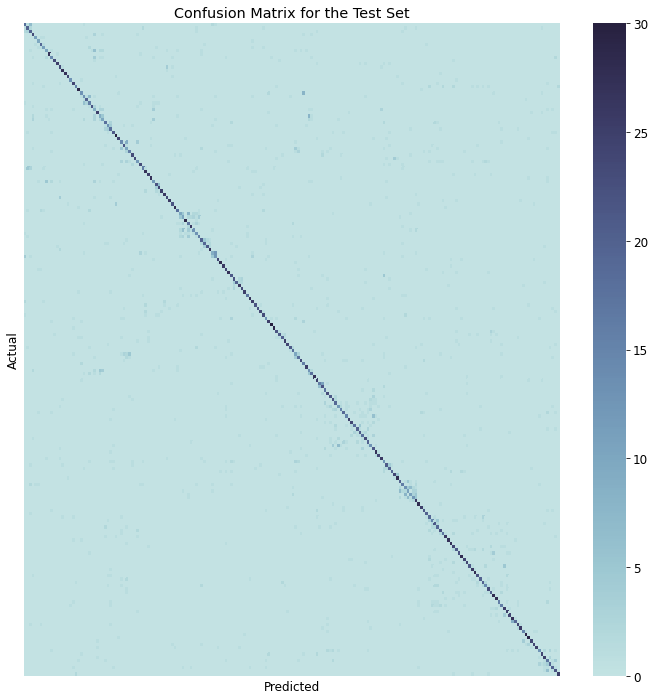

The test accuracy is:  71.4014 %


In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
plot_confusion_matrix(np.matrix(cm), title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

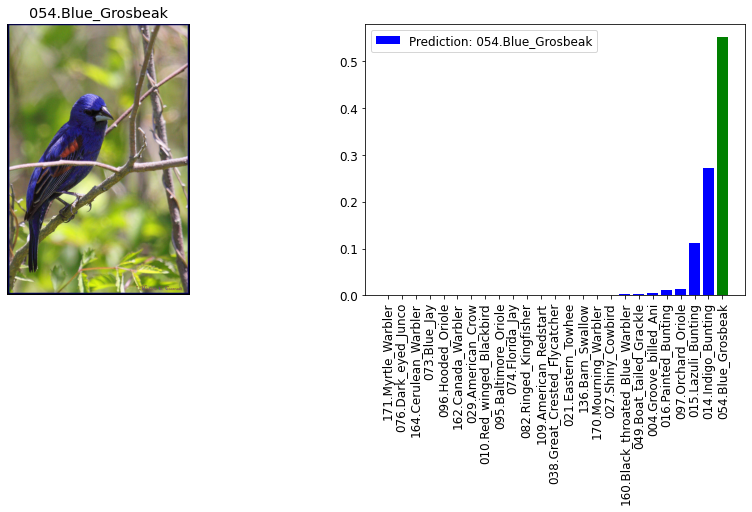

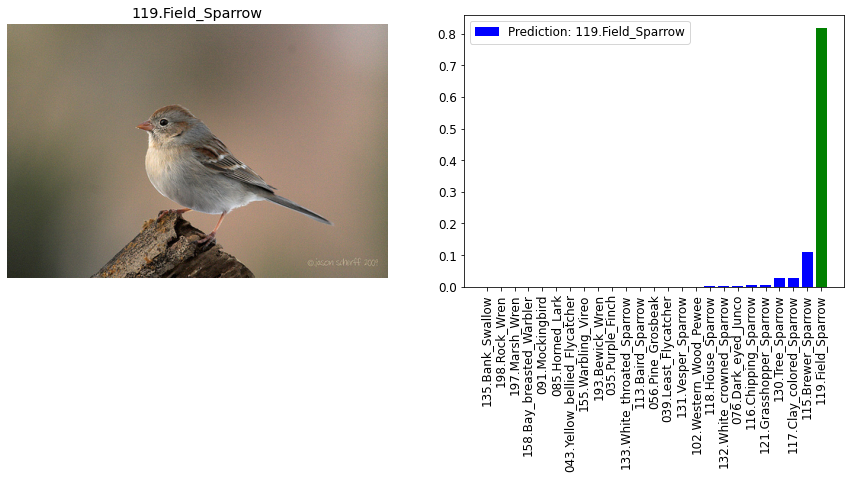

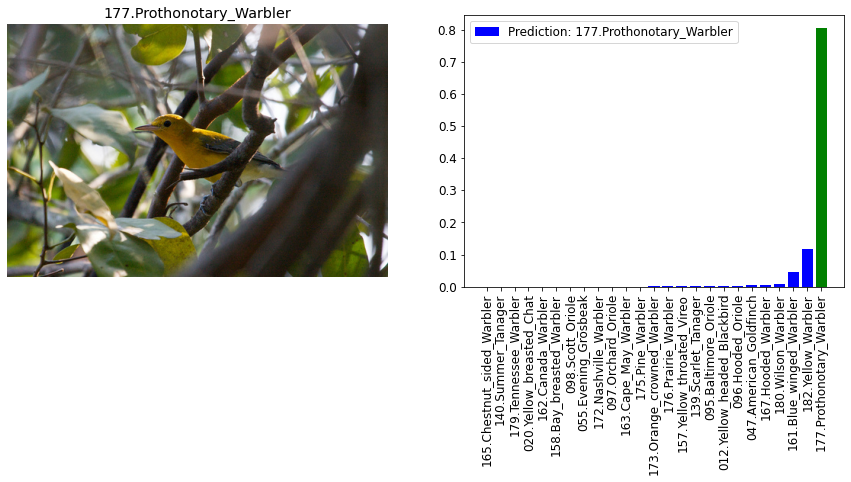

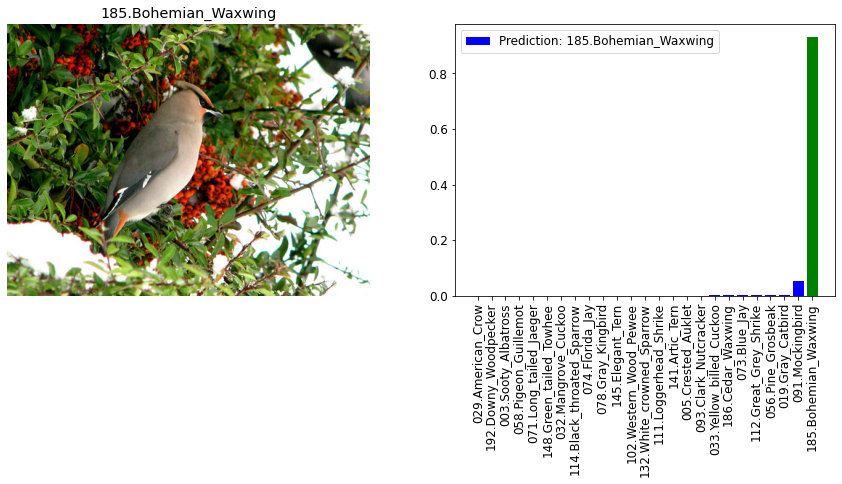

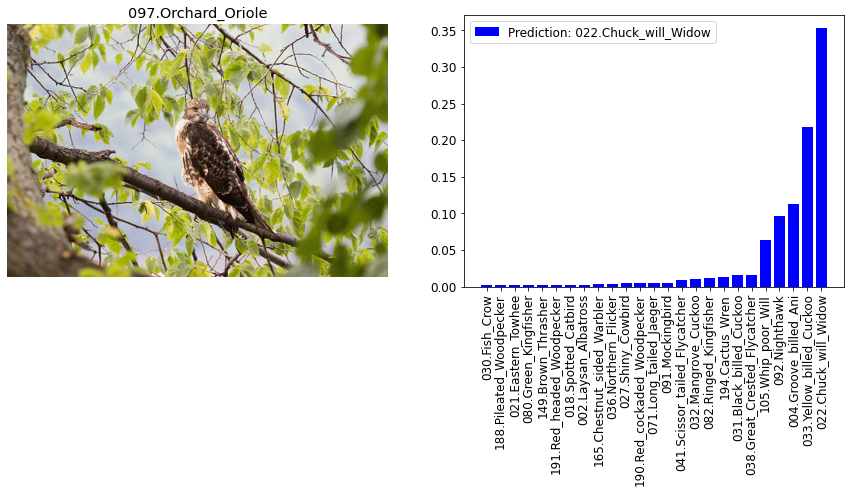

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

### Resultados obtenidos

Resumo aquí todos los resultados en accuracy obtenidos en una ejecución de todo este ejercicio. Nótese que, debido a la aleatoriedad a la hora de crear los batches y elegir el learning rate, estos resultados pueden cambiar si se vuelve a ejecutrar.



* Modelo congelado (Apartados 3.1.1 y 3.1.2):
  * Cabeza fully-connected:
    * Validation: 69.1152 % / 67.2788 %.
    * Test: 67.6044 % / 67.4146 %.
  * Cabeza por defecto de vision_learner:
    * Validation: 68.2805 % / 64.2738 %.
    * Test: 68.174 % / 67.3455 %.
  * Cabeza customizada:
    * Validation: 64.9416 % / 63.4391 %.
    * Test: 65.9475 % / 65.5333 %.


* Fine-tuning del modelo (Apartado 3.2):
  * Cabeza fully-connected:
   * Validation: 67.2788 % / 70.9516 %.
   * Test: 70.7456 % / 70.2623 %.
 * Cabeza por defecto de vision_learner:
   * Validation: 67.6127 % / 67.2788 %.
   * Test: 70.038 % / 69.3131 %.
  * Cabeza customizada:
   * Validation: 64.1068 % / 60.2671 %.
   * Test: 66.0166 % / 64.3079 %.

* Congelado/Descongelado del modelo (Apartado 3.2):
  * Cabeza fully-connected:
   * Validation: 70.2838 % / 69.6160 %.
   * Test: 71.2289 % / 71.4014 %.
 * Cabeza por defecto de vision_learner:
   * Validation: 66.9449 % / 67.7796 %.
   * Test: 67.1384 % / 68.243 %.
  * Cabeza customizada:
   * Validation: 61.7696 % / 63.606 %.
   * Test: 63.4967 % / 64.7049 %.


Todos los modelos proporcionan buenos resultados. Teniendo 200 clases, si eligiésemos al azar, la probabilidad de acertar sería 0.5 %, así que pasar a al menos un 60 % supone una gran mejora.

En particular, haciendo un fine-tuning es como obtenemos mejores resultados en la mayoría de casos. El caso de congelar y descongelar el modelo nos da similares resultados, ya que al fin y al cabo es el mismo procedimiento, pero debido a la simplicitud de implimentarlo con la función fine_tune, tiene más sentido utilizar la función de fastai directamente, y además utilizamos los parámetros por defecto de fastai que suelen ser buenas recomendaciones.

Por último, al igual que vimos en el apartado 3.1.3, obtenemos mejores resultados con las cabezas más simples que añadiendo un cabeza customizada. Al igual que en dicho caso, esto puede deberse a que, como fastai ya está entrenado para estos datos, añadirle complejidad sólo empeora los resultados, o a que la cabeza customizada no es adecuada para este caso.

Al igual que he comentado previamente, tendría más sentido realizar CrossValidation para obtener más confianza en estas conclusiones, pero no lo realizamos debido al tiempo de ejecución y que estos resultados han sido consistentes en diversas ejecuciones.

---



---



---

# **Bonus. (3 points)**  

There are many other possibilities to improve the *BaseNet* model over CIFAR100 using suitable combinations of layers. Feel free to try your own ideas, or those interesting machine learning and computer vision approaches you've read about. Student proposals are expected for discussion and clear definition. Each proposal will be evaluated based on its innovation, complexity, and good use of PyTorch+Fastai. We will also take the mastering of the libraries used in the experiment into consideration.

**Note 1**: The Bonus will only be taken into account if, at least, 75% of the compulsory part is correct. 

**Note 2**: Since Colab only offers limited computational resources, students must try to rationally limit training time, memory consumption and size of the models used. The use of good coding practices is highly advised.

Volvemos a cargar los datos de CIFAR100, pero al crear el DataLoader añadimos modifaciones con *aug_transforms(), que aumenta los datos realizando modificaciones como rotaciones, modificaciones del brillo... Utilizaremos los parámetros por defecto ya que dan buenos resultados.

Eliminamos RandomResizedCrop que usamos en el ejercicio 2, ya que aug_transforms() ya incluye el zoom, y realizar dos transformaciones de zoom en unas imágenes tan pequñas (32x32) empeora los resultados.

Size:  11250
Number of categories:  25
Categories:  ['aquarium_fish', 'baby', 'bear', 'boy', 'bridge', 'castle', 'flatfish', 'fox', 'girl', 'house', 'leopard', 'lion', 'man', 'porcupine', 'possum', 'raccoon', 'ray', 'road', 'shark', 'skunk', 'skyscraper', 'tiger', 'trout', 'wolf', 'woman']


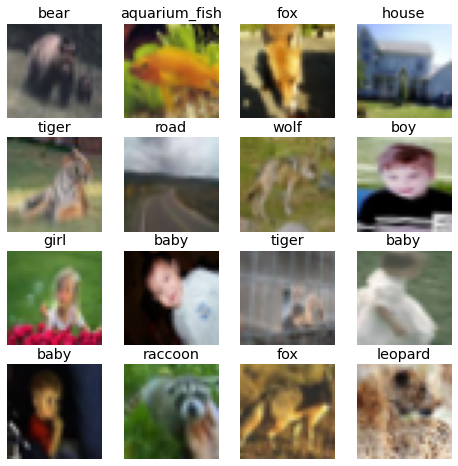

In [ ]:
path = path_cifar
SEED = 42

dls = DataBlock(
    blocks = (ImageBlock, CategoryBlock), # Input: Image, Output: Category
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.1, seed=SEED),
    get_y = parent_label,
    item_tfms = [Resize(32, method='squish')],
    batch_tfms = [Normalize.from_stats(*imagenet_stats), *aug_transforms()]
).dataloaders(path/'train', bs=32)

dls.show_batch(max_n=16, figsize=(8, 8)) # shows a batch of images
print("Size: ", dls.n)
print("Number of categories: ", dls.c)
print("Categories: ", dls.vocab)

Volvemos a definir el modelo que teníamos en el ejercicio 2. Nótese que esto es necesario, en lugar de volver a llamarlo, porque dicho modelo ya estaba entrenado, así que tenemos que volver a instanciarlo para reiniciar los valores.

Es bastante probable que se puedan obtener mejores resultados modificando este modelo. Sin emabargo, ya que tenemos un número elevado de parámetros, si aumentásemos la profundidad del modelo esto provocaría un aumento del tiempo que, debido a que vamos a realizar 25 iteraciones, provocaría aumentar mucho el tiempo de ejecución.

In [ ]:
bonusNet = sequential(
    nn.Conv2d(in_channels=3, out_channels=128, kernel_size=(5,5)), # Output: 28x28x128
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.MaxPool2d(kernel_size=(2,2)), # Output: 14x14x128
    nn.Conv2d(in_channels=128, out_channels=128, padding=1, kernel_size=(3,3)), # Output: 14x14x128
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.Conv2d(in_channels=128, out_channels=128, padding=1, kernel_size=(3,3)), # Output: 14x14x128
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.Conv2d(in_channels=128, out_channels=256, kernel_size=(3,3)), # Output: 12x12x256
    nn.BatchNorm2d(256),
    nn.ReLU(),

    nn.MaxPool2d(kernel_size=(2,2)), # Output: 6x6x256
    nn.Conv2d(in_channels=256, out_channels=256, padding=1, kernel_size=(3,3)), # Output: 6x6x256
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.Conv2d(in_channels=256, out_channels=256, padding=1, kernel_size=(3,3)), # Output: 6x6x256
    nn.BatchNorm2d(256),
    nn.ReLU(),

    nn.Conv2d(in_channels=256, out_channels=512, kernel_size=(3,3)), # Output: 4x4x512
    nn.BatchNorm2d(512),
    nn.ReLU(),

    nn.AvgPool2d((4,4)), # Ouput: 1x1x512
    nn.Flatten(), # Output: 512x1
    nn.BatchNorm1d(512),
    nn.Dropout(),

    nn.Linear(in_features=512, out_features=256), # Output: 256x1
    nn.ReLU(),
    nn.BatchNorm1d(256),
    nn.Dropout(),

    nn.Linear(in_features=256, out_features=25) # Output: 25x1
    # nn.Softmax(dim=-1)
)

Usamos LabelSmoothingCrossEntropyFlat, que funciona similar a CrossEntropyLossFlat pero modificando como los errores reentrenan el modelo reduciendo el overfitting.

Cambiamos el optimizador por ranger, que combina RAdam (Rectified Adam), que realiza modificaciones para corregir la varianza del learning rate, es decir, a diferencia de Adam que con distintos learning rates podemos obtener resultados muy distintos, con RAdam serán similares; con LookAhead, que también ayuda a que el modelo sea menos sensible a la elección de hiperparámetros.

También añadimos MixUp(), que aumenta los datos realizando combinaciones entre las imágenes. Hice pruebas añadiendo CutMix(), que crea nuevas imágenes cortando trozos de una y añadiéndo esos trozos sobre otras, pero los resultados eran peores.

Además, usamos to_fp16() que disminuye la precisión para obtener más uso de la GPU, permitiendonos mayores batches y un entrenamiento más rápido. Debido a que nuestro modelo es relativamente simple, ésta pérdida de precisión no supone ningún problema.

In [ ]:
learn = Learner(dls, bonusNet, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[accuracy, error_rate], opt_func=ranger, cbs=MixUp(0.1)).to_fp16()
learn.summary()

Sequential (Input shape: 32 x 3 x 32 x 32)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 128 x 28 x 28  
Conv2d                                    9728       True      
BatchNorm2d                               256        True      
ReLU                                                           
____________________________________________________________________________
                     32 x 128 x 14 x 14  
MaxPool2d                                                      
Conv2d                                    147584     True      
BatchNorm2d                               256        True      
ReLU                                                           
Conv2d                                    147584     True      
BatchNorm2d                               256        True      
ReLU                                                           
____________________________________________________________________________
               

Volvemos a calcular el Learning Rate, aumentando el tiempo de ejecución para obtener un mejor resultado:

Learning Rate: 0.0006918309954926372


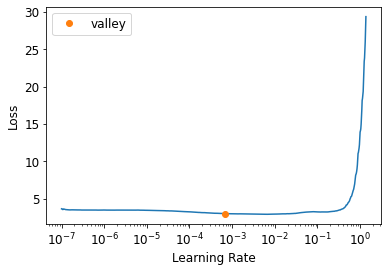

In [ ]:
lr = learn.lr_find(stop_div=False, num_it=1000) # find the maximum value for lr to use in the next call to the optimizer
print(f"Learning Rate: {lr[0]}")

Entrenamos el modelo con los datos de entrenamiento:

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,3.038378,2.727953,0.222400,0.777600,00:27
1,2.735329,2.498531,0.297600,0.702400,00:29
2,2.633234,2.437509,0.316800,0.683200,00:27
3,2.543874,2.226802,0.381600,0.618400,00:27
4,2.444692,2.176976,0.422400,0.577600,00:27
5,2.325387,2.043514,0.436800,0.563200,00:27
6,2.222069,2.042745,0.446400,0.553600,00:27
7,2.128069,2.172858,0.397600,0.602400,00:29
8,2.076969,2.013832,0.477600,0.522400,00:27
9,2.070436,1.944378,0.502400,0.497600,00:27


No improvement since epoch 16: early stopping


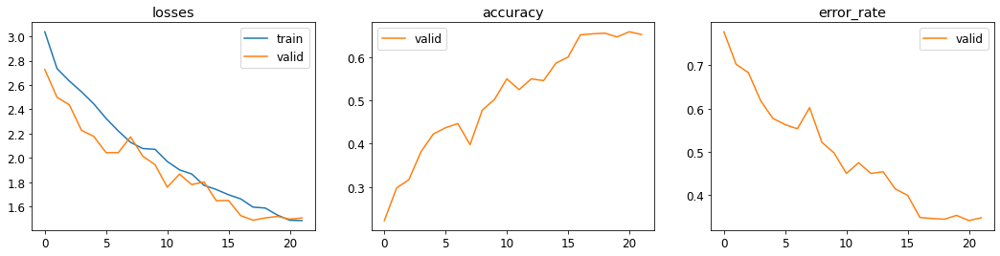

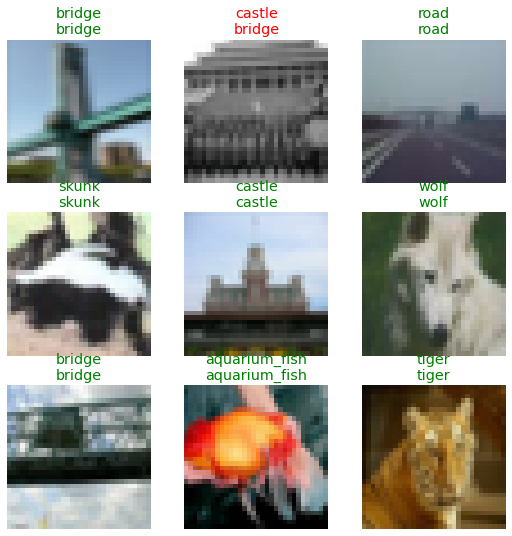

In [ ]:
learn.fit_one_cycle(n_epoch=25, lr_max=lr[0], cbs=EarlyStoppingCallback(monitor='accuracy', min_delta=0.01, patience=5)) # running the optimizer one-cycle
learn.recorder.plot_metrics() # shows accuracy curve along epochs
learn.show_results()

Volvemos a calcular los datos de test:

In [ ]:
files_train = get_image_files(path/'train')
files_test = get_image_files(path/'test')
print('Total training images: ', len(files_train))
print('Total test images: ', len(files_test))

Total training images:  12500
Total test images:  2500


In [ ]:
test_dl = learn.dls.test_dl(files_test, with_labels=True)
print("Size: ", test_dl.n)
print("Number of categories: ", test_dl.c)
print("Categories: ", test_dl.vocab)

Size:  2500
Number of categories:  25
Categories:  ['aquarium_fish', 'baby', 'bear', 'boy', 'bridge', 'castle', 'flatfish', 'fox', 'girl', 'house', 'leopard', 'lion', 'man', 'porcupine', 'possum', 'raccoon', 'ray', 'road', 'shark', 'skunk', 'skyscraper', 'tiger', 'trout', 'wolf', 'woman']


Y finalmente predecimos las etiquetas de entrenamiento y calculamos el accuracy:

Number of test examples: 2500


The test accuracy is:  68.0 %


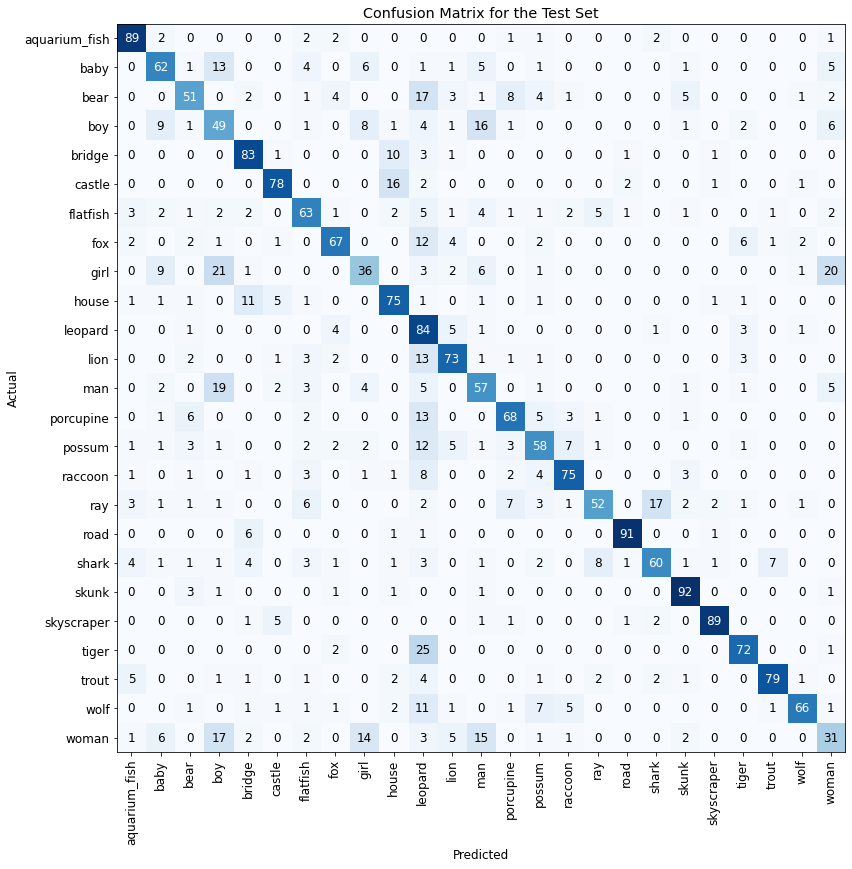

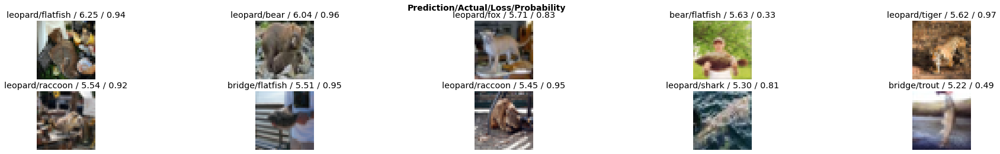

In [ ]:
preds, targs, probs = learn.get_preds(dl=test_dl, with_decoded=True)
# We compute the confusion matrix
interp = ClassificationInterpretation.from_learner(learn, 1, test_dl)
cm = interp.confusion_matrix()
print('Number of test examples:', np.sum(cm))
interp.plot_confusion_matrix(figsize=(12, 12),title='Confusion Matrix for the Test Set')
acc = accuracy(preds, targs)
print('The test accuracy is: ', round(float(acc)*100, 4), '%')

interp.most_confused(min_val=10)
interp.plot_top_losses(10, nrows=2, figsize=(32,4))

Vamos a visualizar varias predicciones:

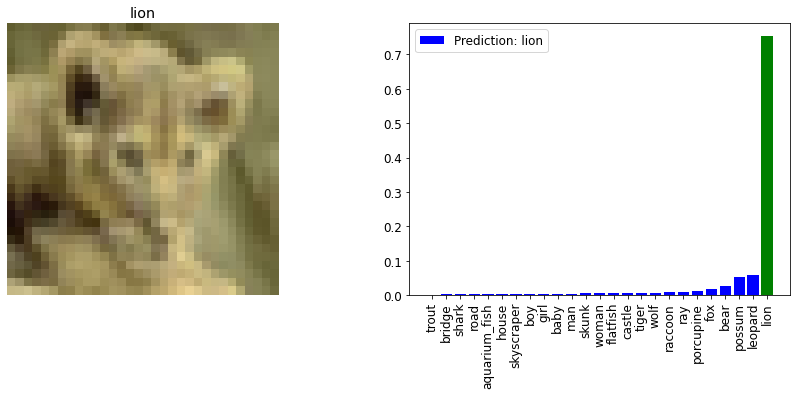

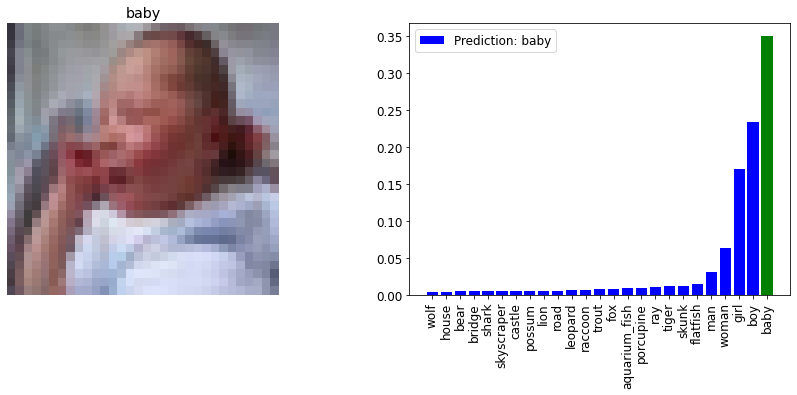

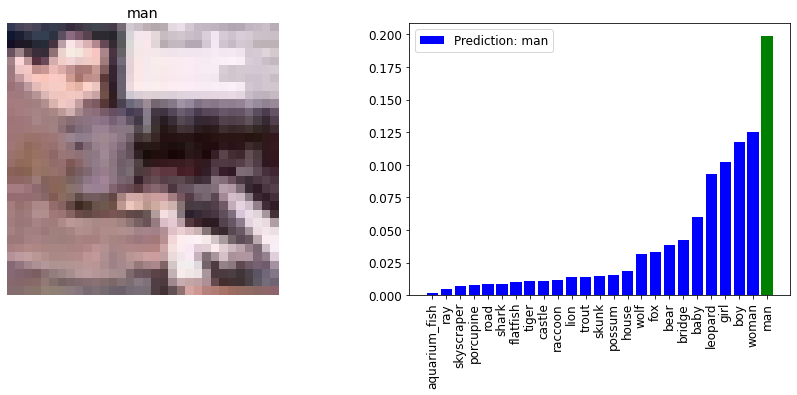

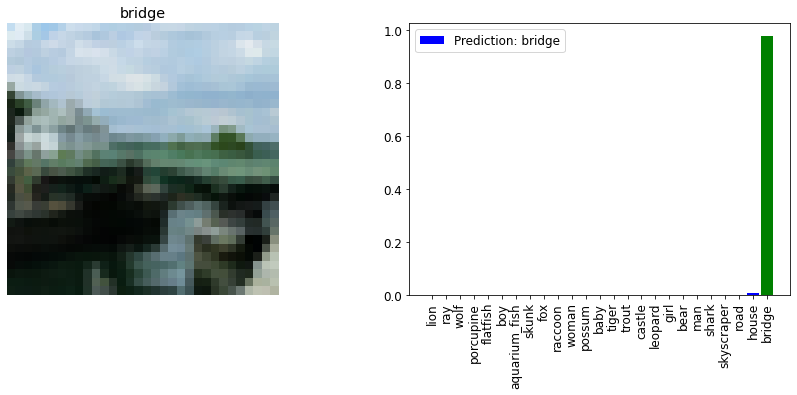

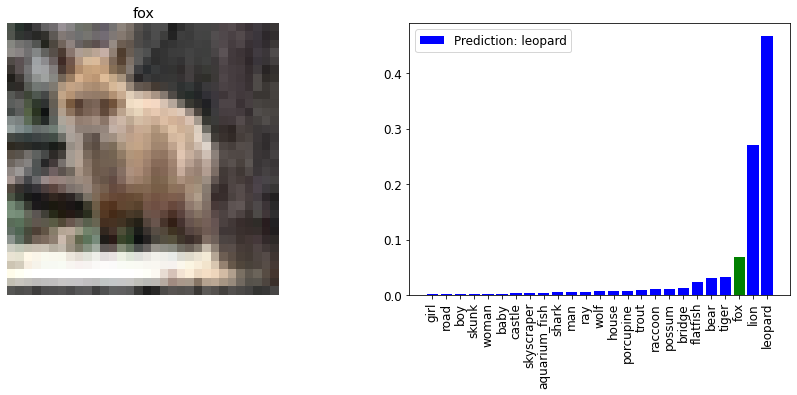

In [ ]:
for i in random.choices(range(test_dl.n), k=5):
  graph_prob(files_test[i], 25)

## Resultados

En los ejercicios en los que usamos CIFAR100 hemos obtenido en dos ejecuciones distintas:
* Ejercicio 1 (con Softmax):
 * Validación: 20.00 % / 19.2 %.
 * Test: 21.92 % / 19.2 %.
* Ejercicio 1 (sin Softmax):
 * Validación: 40.32 % / 41.2 %.
 * Test: 39.88 % / 39.56 % .
* Ejercicio 2:
 * Validación: 59.28 % / 60.32 %.
 * Test: 62.44 % / 61.56 %.
* Bonus:
 * Validación: 66.64 % / 65.2 %.
 * Test: 68.52 % / 68.0 %.

Podemos ver como en el ejercicio 1, como comentamos previamente, no debemos incluir Softmax ya que está incluido en CrossEntropyLossFlat.

En el ejercicio 2, realizando las modificaciones indicadas, que consiste en aumentar la profundidad del modelo, aumentar el número de iteraciones al incluir early stopping, la normalización y aumentar los datos usando zoom y flip, obtenemos una mejora considerable en resultados.

En este apartado bonus, podemos ver como, sin modificar el modelo, podemos obtener mejores resultados aún usando mejores parámetros para el cálculo del error y la optimización, además de aumentar los datos en más formas distintas.

Al igual que hemos comentado en el ejercicio 3, estos resultados serían más consistentes si usásemos CrossValidation. Sin embargo, esto supondría un aumento considerable del tiempo, y debido a que las mejoras han sido consistentes en varias iteraciones que he probado, no lo considero necesario.

Por último, vamos a ver que podemos usar el modelo con imágenes que no pertenecen a las etiquetas que utiliza, aunque obviamente no nos dará el resultado correcto.

Para ello, modificamos la función que nos da las probabilidades para que funcione sin etiquetas:

In [ ]:
def graph_prob(im, n):
  categories = learn.dls.vocab

  # Dicctionary with the predictions
  pred, idx, probs = learn.predict(im)
  prob_dict = dict(zip(categories, map (float, probs)))
  prob_dict = dict(sorted(prob_dict.items(), key=lambda item: item[1]))
  pred = max(prob_dict, key=prob_dict.get)

  dictionary = dict(list(prob_dict.items())[-n:])

  # Plot
  fig, axs = plt.subplots(1, 2, figsize=(15, 5))

  # Image
  axs[0].imshow(im)
  axs[0].axis('off')

  # Bar diagram
  axs[1].bar(list(dictionary.keys()), list(dictionary.values()), label="Prediction: "+pred, color='b')
  axs[1].legend()

  plt.xticks(rotation = 90)

  plt.show()

Y usamos algunas de las imágenes de las prácticas anterioes:

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive


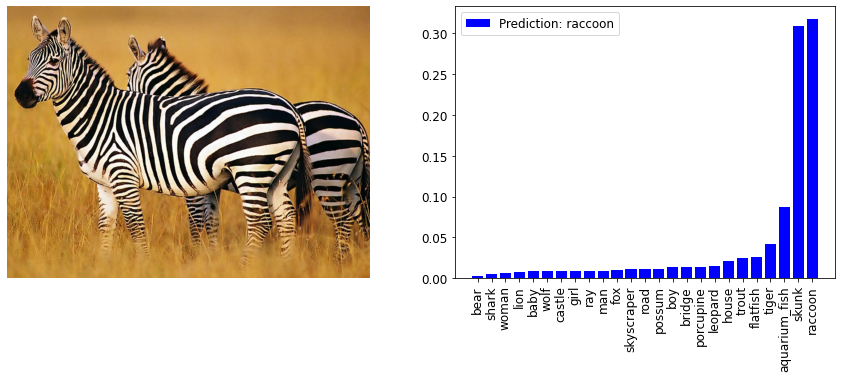

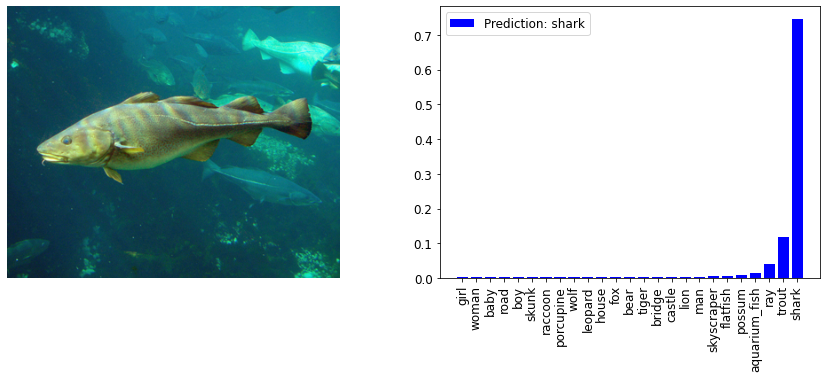

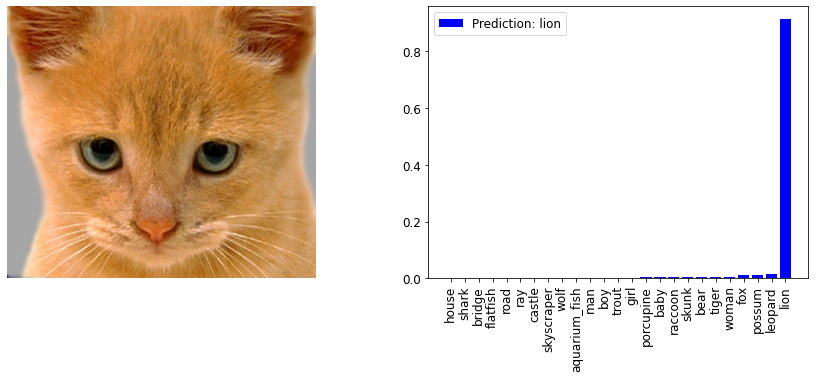

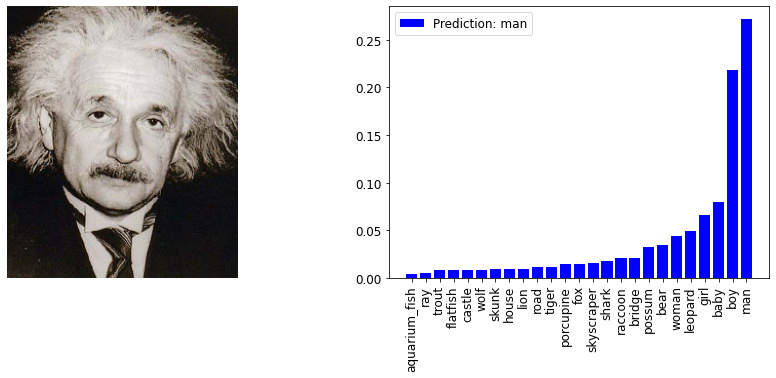

In [ ]:
import os
import cv2
from google.colab import drive
drive.mount('/content/drive')
# change directory
%cd '/content/drive/MyDrive'
get_image = lambda route: os.path.join('/content/drive/MyDrive/images', route)

im = cv2.imread(get_image('zebra.jpg'), 1)[:,:,::-1]
graph_prob(im, 25)

im = cv2.imread(get_image('fish.bmp'), 1)[:,:,::-1]
graph_prob(im, 25)

im = cv2.imread(get_image('cat.bmp'), 1)[:,:,::-1]
graph_prob(im, 25)

im = cv2.imread(get_image('einstein.bmp'), 1)[:,:,::-1]
graph_prob(im, 25)

Podemos ver que, aunque las predicciones son incorrectas ya que no están las etiquetas, al menos toma las categorías parecidas, confundiendo al gato con un león o al pez con un tiburón. Nótese que, como usabamos imágenes 32x32x3 en CIFAR100, lás imágenes que clasifica no son realmente las que mostramos, si no una reducción a 32x32x3.